# <u>AQI EDA

### References

https://has.concord.org/air-pollution.html
https://en.wikipedia.org/wiki/Air_quality_index
https://link.springer.com/article/10.1007/s10668-020-00753-7

https://disc.gsfc.nasa.gov/datasets?page=1&measurement=Nitrogen%20Dioxide
https://www.earthdata.nasa.gov/eosdis/daacs/gesdisc
    
    *************************
This Kaggle dataset has NO2
https://www.kaggle.com/datasets/hasibalmuzdadid/global-air-pollution-dataset
    https://www.kaggle.com/code/dataranch/air-pollution-prediction-xgboost-fastai
    https://www.kaggle.com/code/sasakitetsuya/what-causes-pm2-5
    *************************

    
https://actris.nilu.no/Content/?pageid=586a6ba658174907a0bcd552977d706e    
https://www.nature.com/articles/s41598-018-37304-0/tables/4
*https://www.greenpeace.org/india/en/publication/3951/global-so2-emission-hotspots-database-ranking-the-worlds-worst-sources-of-so2-pollution-2/
https://data.world/data-society/us-air-pollution-dataS    
https://www.kaggle.com/datasets/sogun3/uspollution
https://www.kaggle.com/datasets/elmoallistair/emmision-of-air-pollutants
https://www.kaggle.com/datasets/rohanrao/air-quality-data-in-india
    
**https://www.kaggle.com/datasets/aestheteaman01/air-quality-across-countries-in-covid19
**https://www.kaggle.com/datasets/hemu563/airpollution
**https://www.kaggle.com/datasets/snehasubramanian/world-pollution-1750-2019?select=country+wise+1750+-+2019.xlsx

In [2]:
### Importing Required Libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
data = pd.read_csv("AQI and Lat Long of Countries.csv")
data.head()

,Country,City,AQI Value,AQI Category,CO AQI Value,CO AQI Category,Ozone AQI Value,Ozone AQI Category,NO2 AQI Value,NO2 AQI Category,PM2.5 AQI Value,PM2.5 AQI Category,lat,lng
0,Russian Federation,Praskoveya,51,Moderate,1,Good,36,Good,0,Good,51,Moderate,44.7444,44.2031
1,Brazil,Presidente Dutra,41,Good,1,Good,5,Good,1,Good,41,Good,-5.2900,-44.4900
2,Brazil,Presidente Dutra,41,Good,1,Good,5,Good,1,Good,41,Good,-11.2958,-41.9869
3,Italy,Priolo Gargallo,66,Moderate,1,Good,39,Good,2,Good,66,Moderate,37.1667,15.1833
4,Poland,Przasnysz,34,Good,1,Good,34,Good,0,Good,20,Good,53.0167,20.8833


In [3]:
data.describe(include ='all')

,Country,City,AQI Value,AQI Category,CO AQI Value,CO AQI Category,Ozone AQI Value,Ozone AQI Category,NO2 AQI Value,NO2 AQI Category,PM2.5 AQI Value,PM2.5 AQI Category,lat,lng
count,16393,16695,16695.000000,16695,16695.000000,16695,16695.000000,16695,16695.000000,16695,16695.000000,16695,16695.000000,16695.000000
unique,174,14229,NaN,6,NaN,3,NaN,5,NaN,2,NaN,6,NaN,NaN
top,United States of America,Santa Cruz,NaN,Good,NaN,Good,NaN,Good,NaN,Good,NaN,Good,NaN,NaN
freq,3954,17,NaN,7708,NaN,16691,NaN,15529,NaN,16684,NaN,7936,NaN,NaN
mean,NaN,NaN,62.998682,NaN,1.342138,NaN,31.767355,NaN,3.819647,NaN,59.821324,NaN,30.267148,-3.944485
std,NaN,NaN,43.091971,NaN,2.371379,NaN,22.839343,NaN,5.880677,NaN,43.208298,NaN,22.947398,73.037148
min,NaN,NaN,7.000000,NaN,0.000000,NaN,0.000000,NaN,0.000000,NaN,0.000000,NaN,-54.801900,-171.750000
25%,NaN,NaN,38.500000,NaN,1.000000,NaN,20.000000,NaN,0.000000,NaN,34.000000,NaN,16.515450,-75.180000
50%,NaN,NaN,52.000000,NaN,1.000000,NaN,29.000000,NaN,2.000000,NaN,52.000000,NaN,38.815800,5.643100
75%,NaN,NaN,69.000000,NaN,1.000000,NaN,38.000000,NaN,5.000000,NaN,69.000000,NaN,46.683300,36.275000


In [4]:
data.isna().sum()

Country               302
City                    0
AQI Value               0
AQI Category            0
CO AQI Value            0
CO AQI Category         0
Ozone AQI Value         0
Ozone AQI Category      0
NO2 AQI Value           0
NO2 AQI Category        0
PM2.5 AQI Value         0
PM2.5 AQI Category      0
lat                     0
lng                     0
dtype: int64

we have to impute missing values in the Country variable.
The code for imputation ountry variable is available on the code "impute_country.ipynb" file. 

### Our respose 

In [5]:
data['AQI Category'].unique()

array(['Moderate', 'Good', 'Unhealthy', 'Very Unhealthy',
       'Unhealthy for Sensitive Groups', 'Hazardous'], dtype=object)

In [6]:
data['AQI Category'].value_counts()

Good                              7708
Moderate                          7054
Unhealthy                          871
Unhealthy for Sensitive Groups     869
Very Unhealthy                     131
Hazardous                           62
Name: AQI Category, dtype: int64

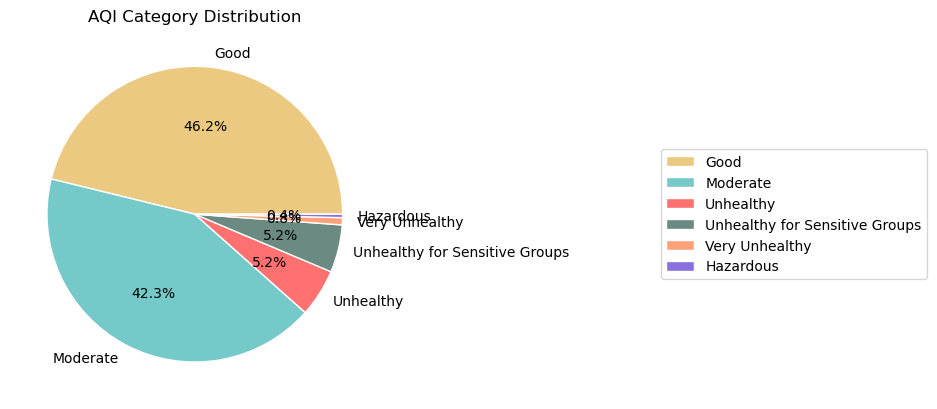

In [7]:
# Calculate the count of each AQI category
category_counts = data['AQI Category'].value_counts()

# Define custom colors for the pie chart
custom_colors = ['#ECC981', '#75C9C8', '#FF7170', '#6A8A82', '#FFA27A', '#8A6FDF']

# Create a pie chart
plt.pie(category_counts, labels=category_counts.index, autopct='%1.1f%%', colors=custom_colors, wedgeprops={'linewidth': 1, 'edgecolor': 'white'})
plt.title('AQI Category Distribution')

# Move the labels outside the pie chart
plt.legend(bbox_to_anchor=(2.5, 0.5), loc='center right')

# Display the pie chart
plt.show()


In [8]:
# Create a mapping dictionary for the new AQI Category
category_mapping = {
    'Unhealthy for Sensitive Groups': 'Unhealthy',
    'Very Unhealthy': 'Unhealthy',
    'Hazardous': 'Unhealthy'
}

# Update the 'AQI Category' column in df2
data['AQI Category'] = data['AQI Category'].replace(category_mapping)


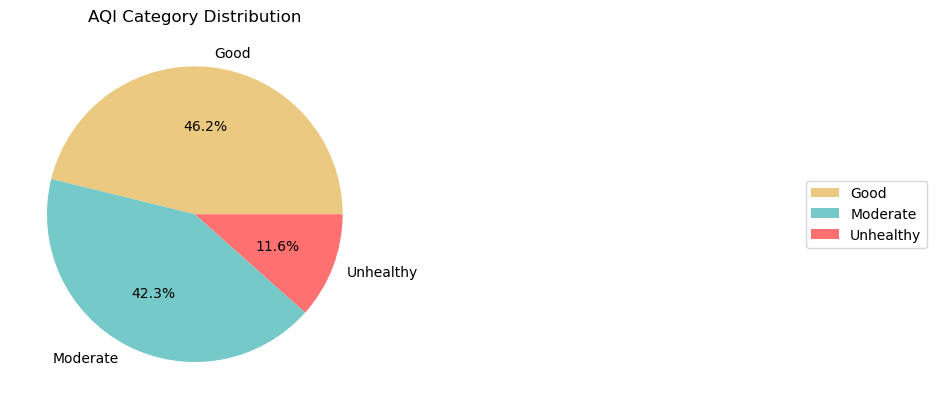

In [9]:
# Calculate the count of each AQI category
category_counts = data['AQI Category'].value_counts()
# Define custom colors for the pie chart
custom_colors2 = ['#ECC981', '#75C9C8', '#FF7170']
# Create a pie chart
plt.pie(category_counts, labels=category_counts.index, autopct='%1.1f%%', colors=custom_colors2)
plt.title('AQI Category Distribution')
# Move the labels outside the pie chart
plt.legend(bbox_to_anchor=(2.5, 0.5), loc='center right')
# Display the pie chart
plt.show()

###### After these preprocessing steps the updated data setis available on the new excel file  "AQI and Lat Long of Countries complete.csv"


In [3]:
### OVerview and more Pre-processing

data = pd.read_csv("AQI and Lat Long of Countries complete.csv")
data.head()

,Country,City,AQI Value,AQI Category,CO AQI Value,CO AQI Category,Ozone AQI Value,Ozone AQI Category,NO2 AQI Value,NO2 AQI Category,PM2.5 AQI Value,PM2.5 AQI Category,lat,lng,SO2
0,Russian Federation,Praskoveya,51,Moderate,1,Good,36,Good,0,Good,51,Moderate,44.7444,44.2031,1
1,Brazil,Presidente Dutra,41,Good,1,Good,5,Good,1,Good,41,Good,-5.2900,-44.4900,1
2,Brazil,Presidente Dutra,41,Good,1,Good,5,Good,1,Good,41,Good,-11.2958,-41.9869,0
3,Italy,Priolo Gargallo,66,Moderate,1,Good,39,Good,2,Good,66,Moderate,37.1667,15.1833,1
4,Poland,Przasnysz,34,Good,1,Good,34,Good,0,Good,20,Good,53.0167,20.8833,1


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16695 entries, 0 to 16694
Data columns (total 15 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Country             16695 non-null  object 
 1   City                16695 non-null  object 
 2   AQI Value           16695 non-null  int64  
 3   AQI Category        16695 non-null  object 
 4   CO AQI Value        16695 non-null  int64  
 5   CO AQI Category     16695 non-null  object 
 6   Ozone AQI Value     16695 non-null  int64  
 7   Ozone AQI Category  16695 non-null  object 
 8   NO2 AQI Value       16695 non-null  int64  
 9   NO2 AQI Category    16695 non-null  object 
 10  PM2.5 AQI Value     16695 non-null  int64  
 11  PM2.5 AQI Category  16695 non-null  object 
 12  lat                 16695 non-null  float64
 13  lng                 16695 non-null  float64
 14  SO2                 16695 non-null  int64  
dtypes: float64(2), int64(6), object(7)
memory usage: 1.9+

In [5]:
data.describe()

,AQI Value,CO AQI Value,Ozone AQI Value,NO2 AQI Value,PM2.5 AQI Value,lat,lng,SO2
count,16695.000000,16695.000000,16695.000000,16695.000000,16695.000000,16695.000000,16695.000000,16695.000000
mean,62.998682,1.342138,31.767355,3.819647,59.821324,30.267148,-3.944485,2.397604
std,43.091971,2.371379,22.839343,5.880677,43.208298,22.947398,73.037148,4.815431
min,7.000000,0.000000,0.000000,0.000000,0.000000,-54.801900,-171.750000,0.000000
25%,38.500000,1.000000,20.000000,0.000000,34.000000,16.515450,-75.180000,1.000000
50%,52.000000,1.000000,29.000000,2.000000,52.000000,38.815800,5.643100,1.000000
75%,69.000000,1.000000,38.000000,5.000000,69.000000,46.683300,36.275000,3.000000
max,500.000000,133.000000,222.000000,91.000000,500.000000,70.767000,178.017800,105.000000


In [6]:
data.describe(include ='all')

,Country,City,AQI Value,AQI Category,CO AQI Value,CO AQI Category,Ozone AQI Value,Ozone AQI Category,NO2 AQI Value,NO2 AQI Category,PM2.5 AQI Value,PM2.5 AQI Category,lat,lng,SO2
count,16695,16695,16695.000000,16695,16695.000000,16695,16695.000000,16695,16695.000000,16695,16695.000000,16695,16695.000000,16695.000000,16695.000000
unique,212,14229,NaN,3,NaN,3,NaN,5,NaN,2,NaN,6,NaN,NaN,NaN
top,United States of America,Santa Cruz,NaN,Good,NaN,Good,NaN,Good,NaN,Good,NaN,Good,NaN,NaN,NaN
freq,3954,17,NaN,7708,NaN,16691,NaN,15529,NaN,16684,NaN,7936,NaN,NaN,NaN
mean,NaN,NaN,62.998682,NaN,1.342138,NaN,31.767355,NaN,3.819647,NaN,59.821324,NaN,30.267148,-3.944485,2.397604
std,NaN,NaN,43.091971,NaN,2.371379,NaN,22.839343,NaN,5.880677,NaN,43.208298,NaN,22.947398,73.037148,4.815431
min,NaN,NaN,7.000000,NaN,0.000000,NaN,0.000000,NaN,0.000000,NaN,0.000000,NaN,-54.801900,-171.750000,0.000000
25%,NaN,NaN,38.500000,NaN,1.000000,NaN,20.000000,NaN,0.000000,NaN,34.000000,NaN,16.515450,-75.180000,1.000000
50%,NaN,NaN,52.000000,NaN,1.000000,NaN,29.000000,NaN,2.000000,NaN,52.000000,NaN,38.815800,5.643100,1.000000
75%,NaN,NaN,69.000000,NaN,1.000000,NaN,38.000000,NaN,5.000000,NaN,69.000000,NaN,46.683300,36.275000,3.000000


In [7]:
data.isna().sum()

Country               0
City                  0
AQI Value             0
AQI Category          0
CO AQI Value          0
CO AQI Category       0
Ozone AQI Value       0
Ozone AQI Category    0
NO2 AQI Value         0
NO2 AQI Category      0
PM2.5 AQI Value       0
PM2.5 AQI Category    0
lat                   0
lng                   0
SO2                   0
dtype: int64

In [8]:
df = data.copy()

In [9]:
df.duplicated().sum()

0

In [10]:
df.dtypes

Country                object
City                   object
AQI Value               int64
AQI Category           object
CO AQI Value            int64
CO AQI Category        object
Ozone AQI Value         int64
Ozone AQI Category     object
NO2 AQI Value           int64
NO2 AQI Category       object
PM2.5 AQI Value         int64
PM2.5 AQI Category     object
lat                   float64
lng                   float64
SO2                     int64
dtype: object

In [11]:
### Feature Engineering

#Continent

country_to_continent = {
    'Russian Federation': 'Europe',
    'Brazil': 'South America',
    'Italy': 'Europe',
    'Poland': 'Europe',
    'United States of America': 'North America',
    'Belgium': 'Europe',
    'China': 'Asia',
    'Netherlands': 'Europe',
    'France': 'Europe',
    'Colombia': 'South America',
    'Romania': 'Europe',
    'Indonesia': 'Asia',
    'Finland': 'Europe',
    'South Africa': 'Africa',
    'United Kingdom of Great Britain and Northern Ireland': 'Europe',
    'India': 'Asia',
    'Haiti': 'North America',
    'Philippines': 'Asia',
    'Latvia': 'Europe',
    'Germany': 'Europe',
    'New Zealand': 'Oceania',
    'Mexico': 'North America',
    'Japan': 'Asia',
    'El Salvador': 'North America',
    'Nigeria': 'Africa',
    'South Sudan': 'Africa',
    'Ireland': 'Europe',
    'Turkey': 'Asia',
    'Democratic Republic of the Congo': 'Africa',
    'Canada': 'North America',
    'Switzerland': 'Europe',
    'Denmark': 'Europe',
    'Cameroon': 'Africa',
    'Australia': 'Oceania',
    'Portugal': 'Europe',
    'Ethiopia': 'Africa',
    'Hungary': 'Europe',
    'Iran (Islamic Republic of)': 'Asia',
    'Israel': 'Asia',
    "Côte d'Ivoire": 'Africa',
    'Papua New Guinea': 'Oceania',
    'Madagascar': 'Africa',
    'Ghana': 'Africa',
    'Armenia': 'Asia',
    'Guatemala': 'North America',
    'Pakistan': 'Asia',
    'Thailand': 'Asia',
    'Malaysia': 'Asia',
    'Ecuador': 'South America',
    'Argentina': 'South America',
    'Peru': 'South America',
    'Dominican Republic': 'North America',
    'Azerbaijan': 'Asia',
    'Spain': 'Europe',
    'Guinea': 'Africa',
    'Bolivia (Plurinational State of)': 'South America',
    'Chile': 'South America',
    'Republic of North Macedonia': 'Europe',
    'Kazakhstan': 'Asia',
    'Serbia': 'Europe',
    'Egypt': 'Africa',
    'Czechia': 'Europe',
    'Malawi': 'Africa',
    'Sierra Leone': 'Africa',
    'Ukraine': 'Europe',
    'Benin': 'Africa',
    'Namibia': 'Africa',
    'Albania': 'Europe',
    'Guyana': 'South America',
    'Senegal': 'Africa',
    'Lesotho': 'Africa',
    'Venezuela (Bolivarian Republic of)': 'South America',
    'Bulgaria': 'Europe',
    'Somalia': 'Africa',
    'Solomon Islands': 'Oceania',
    'Paraguay': 'South America',
    'Zimbabwe': 'Africa',
    'Austria': 'Europe',
    'Croatia': 'Europe',
    'Chad': 'Africa',
    'Honduras': 'North America',
    'United Republic of Tanzania': 'Africa',
    'Cambodia': 'Asia',
    'Uganda': 'Africa',
    'Cuba': 'North America',
    'Uruguay': 'South America',
    'Republic of Moldova': 'Europe',
    'Saint Vincent and the Grenadines': 'North America',
    'Myanmar': 'Asia',
    'Angola': 'Africa',
    'Kingdom of Eswatini': 'Africa',
    'Zambia': 'Africa',
    'Morocco': 'Africa',
    'United States': 'North America',
    'Slovakia': 'Europe',
    'Sweden': 'Europe',
    'Belarus': 'Europe',
    'Norway': 'Europe',
    'Mongolia': 'Asia',
    'Malta': 'Europe',
    'Rwanda': 'Africa',
    'Botswana': 'Africa',
    'Sri Lanka': 'Asia',
    'Burundi': 'Africa',
    'Jamaica': 'North America',
    'Kenya': 'Africa',
    'Slovenia': 'Europe',
    'Mauritius': 'Africa',
    'Nicaragua': 'North America',
    'Uzbekistan': 'Asia',
    'Republic of Korea': 'Asia',
    'Burkina Faso': 'Africa',
    'Cabo Verde': 'Africa',
    'Mozambique': 'Africa',
    'Mauritania': 'Africa',
    'Guinea-Bissau': 'Africa',
    'United Arab Emirates': 'Asia',
    'Bangladesh': 'Asia',
    'Eritrea': 'Africa',
    'Barbados': 'North America',
    'Algeria': 'Africa',
    'Saudi Arabia': 'Asia',
    'Syrian Arab Republic': 'Asia',
    'United Kingdom': 'Europe',
    'Tajikistan': 'Asia',
    'Greece': 'Europe',
    'Liberia': 'Africa',
    "Lao People's Democratic Republic": 'Asia',
    'Bulgaria': 'Europe',
    'Spain': 'Europe',
    'Bhutan': 'Asia',
    'Costa Rica': 'North America',
    'Gambia': 'Africa',
    'Kyrgyzstan': 'Asia',
    'Lithuania': 'Europe',
    'Turkey': 'Asia',
    'Viet Nam': 'Asia',
    'Bosnia and Herzegovina': 'Europe',
    'Saint Lucia': 'North America',
    'Iraq': 'Asia',
    'Mali': 'Africa',
    'Sri Lanka': 'Asia',
    'Georgia': 'Asia',
    'Peru': 'South America',
    'Libya': 'Africa',
    'Niger': 'Africa',
    'Central African Republic': 'Africa',
    'Sudan': 'Africa',
    'Trinidad and Tobago': 'North America',
    'Tanzania': 'Africa',
    'Comoros Komori جزر القمر': 'Africa',
    'Turkmenistan': 'Asia',
    'Croatia': 'Europe',
    'Mozambique': 'Africa',
    'Gabon': 'Africa',
    'Estonia': 'Europe',
    'Panama': 'North America',
    'Bahrain': 'Asia',
    'Denmark': 'Europe',
    'Togo': 'Africa',
    'Congo': 'Africa',
    'Comoros': 'Africa',
    'Nepal': 'Asia',
    'Brazil': 'South America',
    'Thailand': 'Asia',
    'Jordan': 'Asia',
    'Montenegro': 'Europe',
    'Papua Niugini': 'Oceania',
    'Equatorial Guinea': 'Africa',
    'Russian Federation': 'Europe',
    'Senegal': 'Africa',
    'Luxembourg': 'Europe',
    'Aruba': 'North America',
    'Dominican Republic': 'North America',
    'Tunisia': 'Africa',
    'Éire / Ireland': 'Europe',
    'Syrian Arab Republic': 'Asia',
    'Belize': 'North America',
    'Vanuatu': 'Oceania',
    'Finland': 'Europe',
    'Netherlands': 'Europe',
    'Andorra': 'Europe',
    'Algeria': 'Africa',
    'New Zealand/Aotearoa': 'Oceania',
    'Norway': 'Europe',
    'Iceland': 'Europe',
    'Palau': 'Oceania',
    'Suriname': 'South America',
    'Singapore': 'Asia',
    'Maldives': 'Asia',
    'Bahrain': 'Asia',
    'Guinée': 'Africa',
    'Lebanon': 'Asia',
    'Seychelles': 'Africa',
    'State of Palestine': 'Asia',
    'Cyprus': 'Asia',
    'Afghanistan': 'Asia',
    'Pakistan': 'Asia',
    'Yemen': 'Asia',
    'The Bahamas': 'North America',
    'Oman': 'Asia',
    'Sāmoa': 'Oceania',
    'Kuwait': 'Asia',
    'Saint Kitts and Nevis': 'North America',
    'Qatar': 'Asia',
    'Monaco': 'Europe',
    'България': 'Europe',
    'Guiné-Bissau': 'Africa',
    '日本': 'Asia',
    'Italia': 'Europe',
    'Nederland': 'Europe',
    'Comores Komori جزر القمر': 'Africa',
    'မြန်မာ': 'Asia',
    'Norge': 'Europe',
    'Suomi / Finland': 'Europe',
    'Sénégal': 'Africa',
    'Hrvatska': 'Europe',
    'سوريا': 'Asia',
    'پاکستان': 'Asia',
    'México': 'North America',
    'República Dominicana': 'North America',
    'Sverige': 'Europe',
    'Türkiye': 'Asia',
    'Algérie': 'Africa',
    'Россия': 'Asia',
    'Moçambique': 'Africa',
    'Perú': 'South America',
    'ශ්\u200dරී ලංකාව இலங்கை': 'Asia',
    "CÃ´te d'Ivoire": 'Africa',
    'البحرين': 'Asia',
    'Danmark': 'Europe',
    'Brasil': 'South America',
    'España': 'Europe',
    'ประเทศไทย': 'Asia'
}

# Create the 'Continent' variable using the mapping
data['Continent'] = data['Country'].map(country_to_continent)

df['Continent'] = data['Continent']

In [12]:
df

,Country,City,AQI Value,AQI Category,CO AQI Value,CO AQI Category,Ozone AQI Value,Ozone AQI Category,NO2 AQI Value,NO2 AQI Category,PM2.5 AQI Value,PM2.5 AQI Category,lat,lng,SO2,Continent
0,Russian Federation,Praskoveya,51,Moderate,1,Good,36,Good,0,Good,51,Moderate,44.7444,44.2031,1,Europe
1,Brazil,Presidente Dutra,41,Good,1,Good,5,Good,1,Good,41,Good,-5.2900,-44.4900,1,South America
2,Brazil,Presidente Dutra,41,Good,1,Good,5,Good,1,Good,41,Good,-11.2958,-41.9869,0,South America
3,Italy,Priolo Gargallo,66,Moderate,1,Good,39,Good,2,Good,66,Moderate,37.1667,15.1833,1,Europe
4,Poland,Przasnysz,34,Good,1,Good,34,Good,0,Good,20,Good,53.0167,20.8833,1,Europe
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16690,United States of America,Highland Springs,54,Moderate,1,Good,34,Good,5,Good,54,Moderate,37.5516,-77.3285,2,North America
16691,Slovakia,Martin,71,Moderate,1,Good,39,Good,1,Good,71,Moderate,49.0650,18.9219,2,Europe
16692,Slovakia,Martin,71,Moderate,1,Good,39,Good,1,Good,71,Moderate,36.3385,-88.8513,1,Europe
16693,France,Sceaux,50,Good,1,Good,20,Good,5,Good,50,Good,48.7786,2.2906,1,Europe


In [13]:
df.isna().sum()

Country               0
City                  0
AQI Value             0
AQI Category          0
CO AQI Value          0
CO AQI Category       0
Ozone AQI Value       0
Ozone AQI Category    0
NO2 AQI Value         0
NO2 AQI Category      0
PM2.5 AQI Value       0
PM2.5 AQI Category    0
lat                   0
lng                   0
SO2                   0
Continent             0
dtype: int64

In [14]:
countries_with_nan_continent = []
for index, row in df.iterrows():
    if pd.isna(row['Continent']):
        countries_with_nan_continent.append(row['Country'])

print(set(countries_with_nan_continent))

set()


In [15]:
df.describe(include ='all')

,Country,City,AQI Value,AQI Category,CO AQI Value,CO AQI Category,Ozone AQI Value,Ozone AQI Category,NO2 AQI Value,NO2 AQI Category,PM2.5 AQI Value,PM2.5 AQI Category,lat,lng,SO2,Continent
count,16695,16695,16695.000000,16695,16695.000000,16695,16695.000000,16695,16695.000000,16695,16695.000000,16695,16695.000000,16695.000000,16695.000000,16695
unique,212,14229,NaN,3,NaN,3,NaN,5,NaN,2,NaN,6,NaN,NaN,NaN,6
top,United States of America,Santa Cruz,NaN,Good,NaN,Good,NaN,Good,NaN,Good,NaN,Good,NaN,NaN,NaN,Europe
freq,3954,17,NaN,7708,NaN,16691,NaN,15529,NaN,16684,NaN,7936,NaN,NaN,NaN,5881
mean,NaN,NaN,62.998682,NaN,1.342138,NaN,31.767355,NaN,3.819647,NaN,59.821324,NaN,30.267148,-3.944485,2.397604,NaN
std,NaN,NaN,43.091971,NaN,2.371379,NaN,22.839343,NaN,5.880677,NaN,43.208298,NaN,22.947398,73.037148,4.815431,NaN
min,NaN,NaN,7.000000,NaN,0.000000,NaN,0.000000,NaN,0.000000,NaN,0.000000,NaN,-54.801900,-171.750000,0.000000,NaN
25%,NaN,NaN,38.500000,NaN,1.000000,NaN,20.000000,NaN,0.000000,NaN,34.000000,NaN,16.515450,-75.180000,1.000000,NaN
50%,NaN,NaN,52.000000,NaN,1.000000,NaN,29.000000,NaN,2.000000,NaN,52.000000,NaN,38.815800,5.643100,1.000000,NaN
75%,NaN,NaN,69.000000,NaN,1.000000,NaN,38.000000,NaN,5.000000,NaN,69.000000,NaN,46.683300,36.275000,3.000000,NaN


### Univariate Analysis

In [16]:
### AQI

df['AQI Category'].unique()

array(['Moderate', 'Good', 'Unhealthy'], dtype=object)

In [17]:
df['AQI Category'].value_counts()

Good         7708
Moderate     7054
Unhealthy    1933
Name: AQI Category, dtype: int64

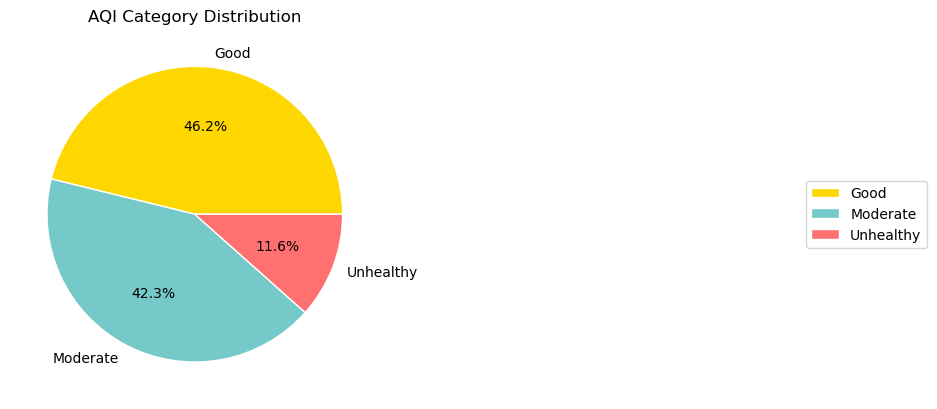

In [18]:
# Calculate the count of each AQI category
category_counts = df['AQI Category'].value_counts()

# Define custom colors for the pie chart
custom_colors2 = ['#FFD700', '#75C9C8', '#FF7170']

# Create a pie chart
plt.pie(category_counts, labels=category_counts.index, autopct='%1.1f%%', colors=custom_colors2, wedgeprops={'linewidth': 1, 'edgecolor': 'white'})
plt.title('AQI Category Distribution')

# Move the labels outside the pie chart
plt.legend(bbox_to_anchor=(2.5, 0.5), loc='center right')

# Display the pie chart
plt.show()

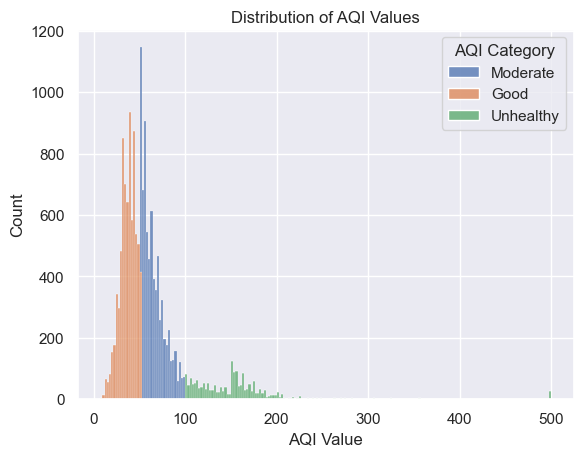

In [19]:
# Define custom colors for each AQI category
custom_colors = ['#ECC981', '#75C9C8', '#FF7170', '#6A8A82', '#FFA27A', '#8A6FDF']

# Set the seaborn theme
sns.set_palette(custom_colors)
sns.set_theme(style='darkgrid')

# Create a histogram with different colors for each AQI category
sns.histplot(df, x='AQI Value', hue='AQI Category', multiple='stack')

# Set the title of the histogram
plt.title('Distribution of AQI Values')

# Display the histogram
plt.show()

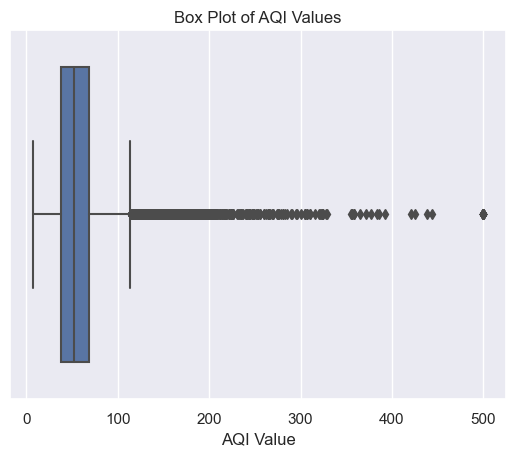

In [20]:
# Create a box plot of AQI values
sns.boxplot(x=df['AQI Value'])

# Set the title of the box plot
plt.title('Box Plot of AQI Values')

# Display the box plot
plt.show()

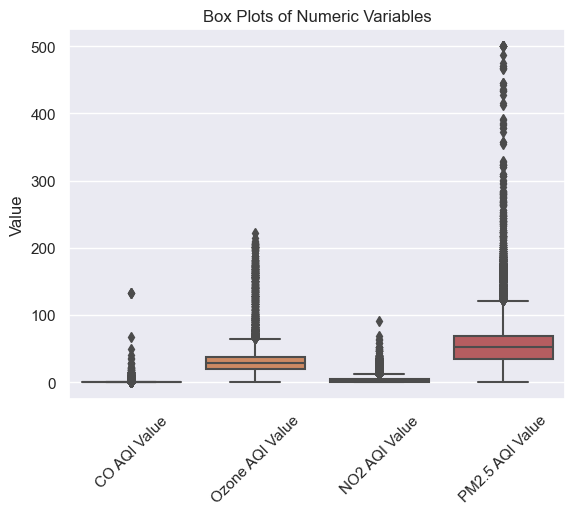

In [21]:
# Select the numeric variables for box plots
numeric_vars = ['CO AQI Value', 'Ozone AQI Value', 'NO2 AQI Value', 'PM2.5 AQI Value']

# Create box plots for the numeric variables
sns.boxplot(data=df[numeric_vars])

# Set the y-axis label
plt.ylabel('Value')

# Set the title of the box plots
plt.title('Box Plots of Numeric Variables')

# Rotate x-axis labels if needed
plt.xticks(rotation=45)

# Display the box plots
plt.show()

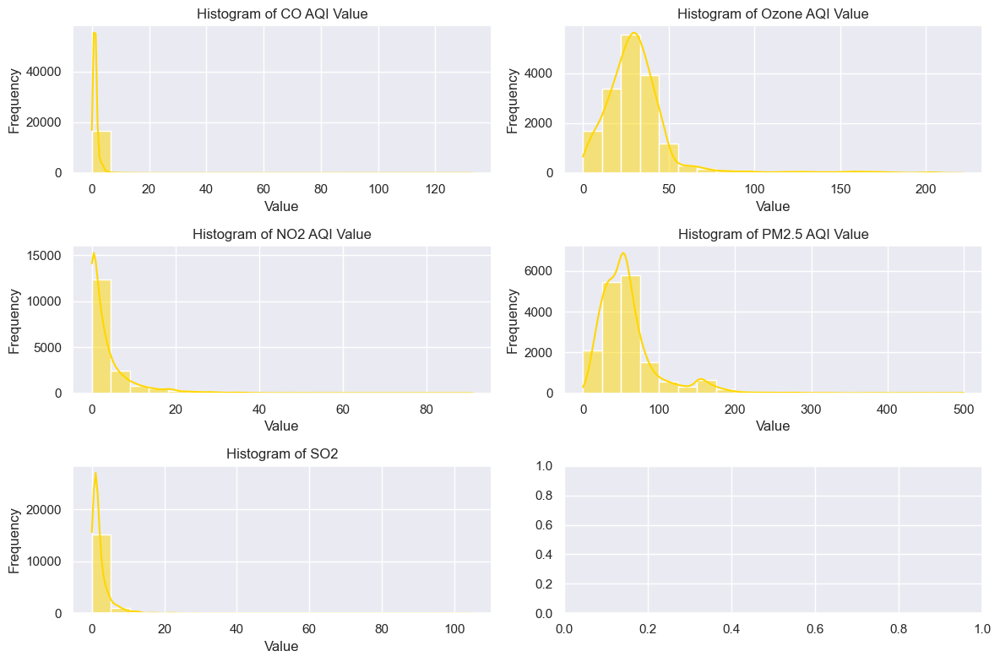

In [22]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Select the numeric variables for histograms
numeric_vars = ['CO AQI Value', 'Ozone AQI Value', 'NO2 AQI Value', 'PM2.5 AQI Value','SO2']

# Set up the subplots
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(12, 8))

# Flatten the axes array for easier indexing
axes = axes.flatten()

# Create histograms for each numeric variable
for i, var in enumerate(numeric_vars):
    sns.histplot(data=df[var], bins=20, kde=True, ax=axes[i],color='#FFD700')
    axes[i].set_xlabel('Value')
    axes[i].set_ylabel('Frequency')
    axes[i].set_title(f'Histogram of {var}')
    axes[i].grid(True)

# Adjust layout and display the histograms
plt.tight_layout()
plt.show()


In [23]:
### Country

len(df['Country'].unique())

212

In [24]:
country_counts = df['Country'].value_counts()
country_counts.head(20)

United States of America                                3954
Germany                                                 1072
Brazil                                                   890
Russian Federation                                       889
Italy                                                    866
India                                                    800
Japan                                                    498
France                                                   467
United Kingdom of Great Britain and Northern Ireland     454
China                                                    431
Philippines                                              373
Mexico                                                   326
Spain                                                    293
Netherlands                                              265
Belgium                                                  254
Colombia                                                 228
Poland                  

In [25]:
# Calculate the percentage of observations for each country
country_percentages = df['Country'].value_counts(normalize=True) * 100

# Get the top 10 countries with the highest percentage of observations
top_10_countries_percentage = country_percentages.head(10)

# Print the top 10 countries with their respective percentages
print(top_10_countries_percentage)

United States of America                                23.683738
Germany                                                  6.421084
Brazil                                                   5.330937
Russian Federation                                       5.324948
Italy                                                    5.187182
India                                                    4.791854
Japan                                                    2.982929
France                                                   2.797245
United Kingdom of Great Britain and Northern Ireland     2.719377
China                                                    2.581611
Name: Country, dtype: float64


### Bi-variate

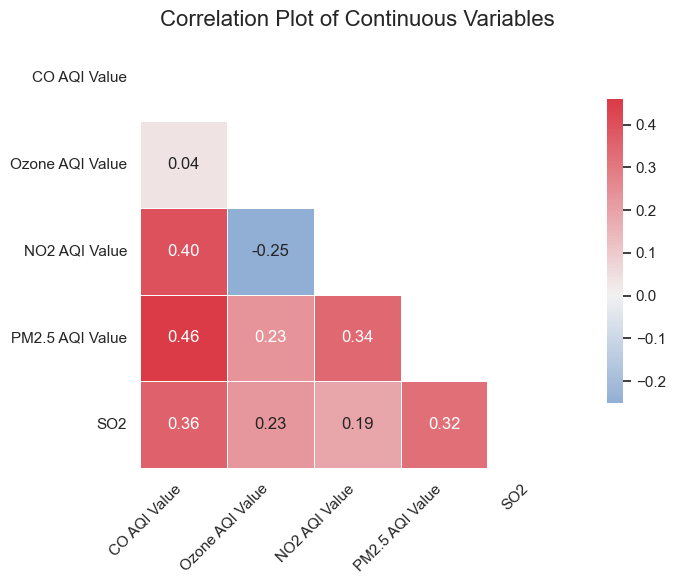

In [26]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming you have a DataFrame named 'df' containing the relevant data

# List of continuous variables for correlation plot
continuous_vars = ['CO AQI Value', 'Ozone AQI Value', 'NO2 AQI Value', 'PM2.5 AQI Value', 'SO2']

# Compute the correlation matrix
corr_matrix = df[continuous_vars].corr()

# Create a mask for the upper triangle
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

# Set up a custom style for the plot
sns.set_theme(style="white")
cmap = sns.diverging_palette(250, 10, as_cmap=True)

# Create a figure and axes
fig, ax = plt.subplots(figsize=(8, 6))

# Plot the correlation matrix with masked upper triangle
sns.heatmap(corr_matrix, mask=mask, cmap=cmap, center=0, annot=True, fmt=".2f", square=True, linewidths=0.5, cbar=True, cbar_kws={"shrink": 0.7}, ax=ax)

# Set the title of the correlation plot
ax.set_title('Correlation Plot of Continuous Variables', fontsize=16)

# Customize tick labels
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')
ax.set_yticklabels(ax.get_yticklabels(), rotation=0)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()


In [27]:
df.dtypes

Country                object
City                   object
AQI Value               int64
AQI Category           object
CO AQI Value            int64
CO AQI Category        object
Ozone AQI Value         int64
Ozone AQI Category     object
NO2 AQI Value           int64
NO2 AQI Category       object
PM2.5 AQI Value         int64
PM2.5 AQI Category     object
lat                   float64
lng                   float64
SO2                     int64
Continent              object
dtype: object

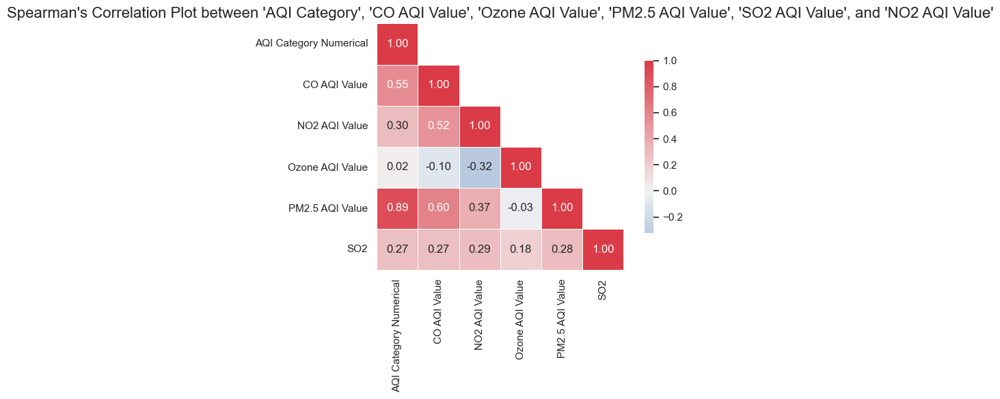

In [28]:
### Spearman Correlation

category_mapping = {
    'Good': 1,
    'Moderate': 2,
    'Unhealthy': 3,
}

# Apply the mapping to create a new numerical column
df['AQI Category Numerical'] = df['AQI Category'].map(category_mapping)

# Now you can use the 'AQI Category Numerical' column for analysis

# Compute the Spearman's correlation matrix
corr_matrix = df[['AQI Category Numerical', 'CO AQI Value', 'NO2 AQI Value', 'Ozone AQI Value', 'PM2.5 AQI Value', 'SO2']].corr(method='spearman')

# Create a figure and axes for the plot
fig, ax = plt.subplots(figsize=(8, 6))

# Generate a colormap
cmap = sns.diverging_palette(250, 10, as_cmap=True)

# Create a mask for the upper triangle
mask = np.triu(np.ones(corr_matrix.shape), k=1)

# Plot the correlation matrix with the mask
sns.heatmap(corr_matrix, cmap=cmap, center=0, annot=True, fmt=".2f", square=True, linewidths=0.5, cbar=True, cbar_kws={"shrink": 0.7}, ax=ax, mask=mask)

# Set the title of the correlation plot
ax.set_title("Spearman's Correlation Plot between 'AQI Category', 'CO AQI Value', 'Ozone AQI Value', 'PM2.5 AQI Value', 'SO2 AQI Value', and 'NO2 AQI Value'", fontsize=16)

# Show the plot
plt.tight_layout()
plt.show()


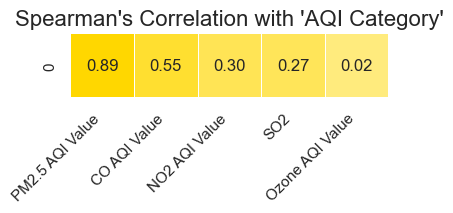

In [29]:
import numpy as np

# Compute the Spearman's correlation between 'AQI Category Numerical' and other variables
correlations = df[['AQI Category Numerical', 'CO AQI Value', 'NO2 AQI Value', 'Ozone AQI Value', 'PM2.5 AQI Value', 'SO2']].corr(method='spearman').iloc[0, 1:]

# Sort correlations from highest to lowest
sorted_correlations = correlations.sort_values(ascending=False)

# Reshape sorted_correlations into a 1x5 array for plotting
correlation_matrix = np.array(sorted_correlations).reshape(1, -1)

# Create a figure and axes for the plot
fig, ax = plt.subplots(figsize=(8, 2))

# Create a custom color map with shades of '#FFD700'
cmap = sns.blend_palette(['#FFFFFF', '#FFD700'], as_cmap=True)

# Plot the correlation values as a heatmap-style visualization
sns.heatmap(correlation_matrix, cmap=cmap, center=0, annot=True, fmt=".2f", square=True, linewidths=0.5, cbar=False, ax=ax)

# Set the x-axis labels to the variable names
ax.set_xticklabels(sorted_correlations.index, rotation=45, ha='right')

# Set the title of the plot
ax.set_title("Spearman's Correlation with 'AQI Category'", fontsize=16)

# Show the plot
plt.tight_layout()
plt.show()


In [30]:
correlation_matrix 

array([[0.89169769, 0.55327715, 0.29644636, 0.27175706, 0.02080043]])

In [31]:
### Chi-square Test

#continent
from scipy.stats import chi2_contingency

chisqt = pd.crosstab(df['Continent'], df['AQI Category'], margins=True)
print(chisqt)

AQI Category   Good  Moderate  Unhealthy    All
Continent                                      
Africa          406       494        211   1111
Asia            800      1105       1122   3027
Europe         3612      2185         84   5881
North America  1726      2816        374   4916
Oceania         131         9          4    144
South America  1033       445        138   1616
All            7708      7054       1933  16695


In [32]:
value = np.array([chisqt.iloc[0][0:5].values,
                  chisqt.iloc[1][0:5].values])
print(chi2_contingency(value)[0:3])

#From below, 9.264388420200502e-27 is the p-value, 122.59 is the statistical value and 3 is the degree of freedom.
#very small p-value (9.264388420200502e-27) indicates strong evidence against the null hypothesis. It suggests that the observed frequencies in the contingency table are not just due to chance, but likely indicate a real association between the variables.

(124.27404939624157, 9.264388420200502e-27, 3)


In [33]:
import plotly.express as px

# Map AQI categories to colors
category_colors = {'Unhealthy': 'red', 'Good': 'green', 'Moderate': 'yellow'}

fig = px.scatter_mapbox(df,  # Use 'df' instead of 'data'
                        lon='lng',
                        lat='lat',
                        color='AQI Category',  # Specify color based on AQI Category
                        color_discrete_map=category_colors,  # Map categories to colors
                        zoom=2,
                        width=1100,
                        height=800,
                        title='Air Quality across the world')

fig.update_layout(mapbox_style='stamen-terrain')
fig.update_layout(legend=dict(orientation="h"))
fig.show()


In [34]:
#Country

chisqt = pd.crosstab(df['Country'], df['AQI Category'], margins=True)
value = np.array([chisqt.iloc[0][0:212].values,
                  chisqt.iloc[1][0:212].values])
print(chi2_contingency(value)[0:3])

#p value> 0.05. Do not reject H0.

(0.4444444444444444, 0.9309157491236488, 3)


## PM 2.5

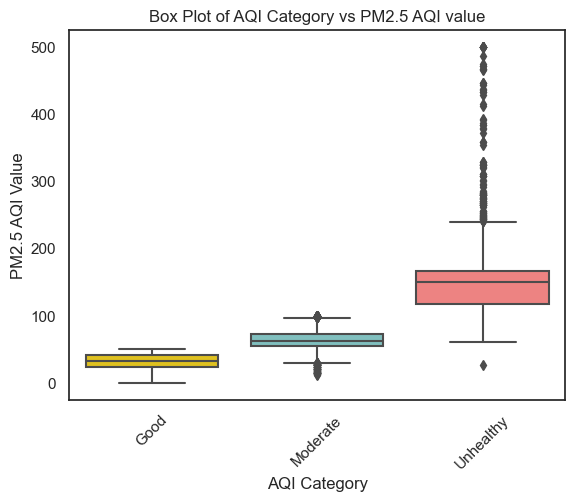

In [35]:
# Define the desired order of AQI categories
category_order = ['Good', 'Moderate', 'Unhealthy']

# Create a box plot of Ozone AQI Value vs AQI Category
sns.boxplot(x='AQI Category', y='PM2.5 AQI Value', data=df , order=category_order,palette=custom_colors2)

# Set the x-axis label
plt.xlabel('AQI Category')

# Set the y-axis label
plt.ylabel('PM2.5 AQI Value')

# Set the title of the box plot
plt.title('Box Plot of AQI Category vs PM2.5 AQI value')

# Rotate x-axis labels if needed
plt.xticks(rotation=45)

# Display the box plot
plt.show()

In [36]:
# Get the outliers for the Unhealthy category
outliers = df.loc[df['AQI Category'] == 'Unhealthy', 'PM2.5 AQI Value'].sort_values(ascending=False)

# Investigate the outliers
for outlier in outliers:
    print(f'Outlier: {outlier}')
    print(f'Country: {df.loc[df["PM2.5 AQI Value"] == outlier, "Country"]}')
    #print(f'City: {df.loc[df["PM2.5 AQI Value"] == outlier, "City"]}')

Outlier: 500
Country: 3768     United States of America
3769     United States of America
3770     United States of America
3853                        India
5924                        India
9220                        India
10672                       India
10673                       India
12994                South Africa
14738                       India
Name: Country, dtype: object
Outlier: 500
Country: 3768     United States of America
3769     United States of America
3770     United States of America
3853                        India
5924                        India
9220                        India
10672                       India
10673                       India
12994                South Africa
14738                       India
Name: Country, dtype: object
Outlier: 500
Country: 3768     United States of America
3769     United States of America
3770     United States of America
3853                        India
5924                        India
9220                      

Country: 332    India
333    India
948    India
Name: Country, dtype: object
Outlier: 226
Country: 332    India
333    India
948    India
Name: Country, dtype: object
Outlier: 226
Country: 332    India
333    India
948    India
Name: Country, dtype: object
Outlier: 225
Country: 8338    Indonesia
Name: Country, dtype: object
Outlier: 224
Country: 1498       Mexico
4984        India
4985        India
5742     Pakistan
6220     Pakistan
14232      Mexico
Name: Country, dtype: object
Outlier: 224
Country: 1498       Mexico
4984        India
4985        India
5742     Pakistan
6220     Pakistan
14232      Mexico
Name: Country, dtype: object
Outlier: 224
Country: 1498       Mexico
4984        India
4985        India
5742     Pakistan
6220     Pakistan
14232      Mexico
Name: Country, dtype: object
Outlier: 224
Country: 1498       Mexico
4984        India
4985        India
5742     Pakistan
6220     Pakistan
14232      Mexico
Name: Country, dtype: object
Outlier: 224
Country: 1498       Mexic

Country: 3610    Pakistan
5213       India
6792       India
8624      Mexico
Name: Country, dtype: object
Outlier: 189
Country: 3610    Pakistan
5213       India
6792       India
8624      Mexico
Name: Country, dtype: object
Outlier: 189
Country: 3610    Pakistan
5213       India
6792       India
8624      Mexico
Name: Country, dtype: object
Outlier: 189
Country: 3610    Pakistan
5213       India
6792       India
8624      Mexico
Name: Country, dtype: object
Outlier: 188
Country: 1639     South Africa
2411            India
4630         Pakistan
5050            India
8407        Indonesia
10646           India
11144         Bahrain
Name: Country, dtype: object
Outlier: 188
Country: 1639     South Africa
2411            India
4630         Pakistan
5050            India
8407        Indonesia
10646           India
11144         Bahrain
Name: Country, dtype: object
Outlier: 188
Country: 1639     South Africa
2411            India
4630         Pakistan
5050            India
8407        Indon

Country: 422       Senegal
2624     Pakistan
3389     Pakistan
3965        India
6401        Chile
6402        Chile
6403        Chile
6404        Chile
6405        Chile
6406        Chile
6945        India
7478        China
7479        China
7678       Uganda
8229        India
9522        India
11872       India
Name: Country, dtype: object
Outlier: 176
Country: 422       Senegal
2624     Pakistan
3389     Pakistan
3965        India
6401        Chile
6402        Chile
6403        Chile
6404        Chile
6405        Chile
6406        Chile
6945        India
7478        China
7479        China
7678       Uganda
8229        India
9522        India
11872       India
Name: Country, dtype: object
Outlier: 176
Country: 422       Senegal
2624     Pakistan
3389     Pakistan
3965        India
6401        Chile
6402        Chile
6403        Chile
6404        Chile
6405        Chile
6406        Chile
6945        India
7478        China
7479        China
7678       Uganda
8229        India
9522   

Country: 1837            India
1970       Uzbekistan
3036            India
4141            India
4646           Mexico
6903            China
8047            India
8075            China
9018         Pakistan
10293        Pakistan
10475           China
11422       Indonesia
11774         Senegal
12407           India
13209           India
13268    South Africa
13392          Mexico
15852        Pakistan
Name: Country, dtype: object
Outlier: 168
Country: 1837            India
1970       Uzbekistan
3036            India
4141            India
4646           Mexico
6903            China
8047            India
8075            China
9018         Pakistan
10293        Pakistan
10475           China
11422       Indonesia
11774         Senegal
12407           India
13209           India
13268    South Africa
13392          Mexico
15852        Pakistan
Name: Country, dtype: object
Outlier: 168
Country: 1837            India
1970       Uzbekistan
3036            India
4141            India
4646     

Country: 109                                   India
176                                  Mexico
560        Saint Vincent and the Grenadines
2814                              Indonesia
2851               United States of America
2852               United States of America
4157                                  India
5446                                  India
5877                                  Aruba
5878                                  Aruba
6435                           Turkmenistan
6640                                  India
7264                                  India
7488                                  India
7953             Iran (Islamic Republic of)
7957                                  India
9422                                  India
10391                              Pakistan
10761                                 China
10871                               Eritrea
11232                                Mexico
11598                                Brazil
11599                  

Country: 563                                 China
1789                                India
1790                                India
2254                                India
2363                                India
3292                                India
5431                                India
6029                                China
6450                                India
6612                                India
6899                               Mexico
7667                               Uganda
8004                             Paraguay
8327                            Indonesia
10008                               India
10009                               India
10340    Democratic Republic of the Congo
11273                               India
12161                               India
12276                              Mexico
12344                        South Africa
12369    Democratic Republic of the Congo
14170                               India
14562                    

Country: 175                         China
287                         India
1045                       Brazil
2006                        India
2786                     Pakistan
3890                        India
4228                     Pakistan
4272                        China
4444                         Chad
4628                        India
4929                       Uganda
5129                       Brazil
6547                       Mexico
6800                       Brazil
6987                        India
7113                        China
7561                        India
9247                     Ethiopia
9469         United Arab Emirates
9588                 South Africa
10600                       China
10731                    Pakistan
11787                       India
12250    United States of America
12258                       India
12884                       India
13187                South Africa
13421                       Yemen
13422                       Yemen
13861

Country: 15                           Brazil
914                           China
953                         Senegal
958                    South Africa
1848                          India
1960                          India
1994                   South Africa
2040                         Angola
2073                          India
2839                        Algeria
2850                       Pakistan
3179                          India
5186                          China
5743                          India
5922                          India
6112                         Gambia
6122                          India
6194                          India
6352                         Mexico
6893                        Nigeria
8173       United States of America
8174       United States of America
8175       United States of America
8385                          India
8524     Iran (Islamic Republic of)
8627                          India
8820                       Pakistan
9145               

Country: 230        United States of America
1118           United Arab Emirates
2283                         Mexico
2418                      Indonesia
2911                      Indonesia
3145                          India
3741                          India
3981                          India
4128                          Niger
4219                    Philippines
4967                          India
5019                          India
5935                          China
6811                         Brazil
7204     Iran (Islamic Republic of)
7552                    Philippines
8419                          India
8582       United States of America
8764                          India
10248    Iran (Islamic Republic of)
10365                         China
10868                         India
11316                        Uganda
11744                    Uzbekistan
13073                        Brazil
15308                    Bangladesh
15531                         India
15600              

Country: 452                                   China
492                                   India
1242                                  India
1490               United States of America
1624               United States of America
1784                                  India
2828                   United Arab Emirates
3856                                  China
3857                                  China
4612                                  India
5178                     Dominican Republic
5179                     Dominican Republic
5180                     Dominican Republic
5578                                 Brazil
6149                           Saudi Arabia
6221                                  India
6486                                  India
6887                                  India
7073                                  India
7369                            Philippines
7370                            Philippines
7371                            Philippines
7372                   

Country: 4059                  El Salvador
4060                  El Salvador
5735                      Senegal
6446                        India
7205                        China
7743                        China
7854                        India
8929                        India
9789     United States of America
12184                       India
14962                       India
Name: Country, dtype: object
Outlier: 146
Country: 4059                  El Salvador
4060                  El Salvador
5735                      Senegal
6446                        India
7205                        China
7743                        China
7854                        India
8929                        India
9789     United States of America
12184                       India
14962                       India
Name: Country, dtype: object
Outlier: 146
Country: 4059                  El Salvador
4060                  El Salvador
5735                      Senegal
6446                        India
7205 

Country: 602                       Nigeria
2607           Russian Federation
3753     United States of America
4752     United States of America
5973     United States of America
6614                      Somalia
7481                        China
7482                        China
7483                        China
7912                   Tajikistan
11427                       India
12071    United States of America
12072    United States of America
12073    United States of America
13365    United States of America
15903                  Uzbekistan
16564    United States of America
Name: Country, dtype: object
Outlier: 138
Country: 602                       Nigeria
2607           Russian Federation
3753     United States of America
4752     United States of America
5973     United States of America
6614                      Somalia
7481                        China
7482                        China
7483                        China
7912                   Tajikistan
11427                 

Country: 1415                             Tajikistan
1646                                  China
3462                                 Israel
6266                              Indonesia
7433                                  India
7988                                  India
8750               United States of America
8751               United States of America
9065                                  China
9066                                  China
9833                            El Salvador
9834                            El Salvador
10549    Venezuela (Bolivarian Republic of)
11188                                 India
12532                                 India
12796                                 India
12955              United States of America
13797                                Brazil
13817              United States of America
15034                                 China
Name: Country, dtype: object
Outlier: 132
Country: 1415                             Tajikistan
1646            

Country: 37                          Haiti
210                         Italy
734                         China
2027     United States of America
3812                       Brazil
3920                        India
5236     United States of America
5237     United States of America
5853                   Uzbekistan
6044     United States of America
6116                    Guatemala
8251           Dominican Republic
8572                        India
9284                        Italy
9742     United States of America
12289    United States of America
12961                       China
13613                    Cameroon
14811                       India
Name: Country, dtype: object
Outlier: 124
Country: 37                          Haiti
210                         Italy
734                         China
2027     United States of America
3812                       Brazil
3920                        India
5236     United States of America
5237     United States of America
5853                  

Country: 438      Venezuela (Bolivarian Republic of)
1198                                 Uganda
2065                                   Iraq
2468                                 France
3312                     Dominican Republic
4993                             Uzbekistan
4994                             Uzbekistan
5402                                 Serbia
6649                                 Brazil
6888                                  India
8146               United States of America
8147               United States of America
8454                                 Uganda
8477                                  China
10633                           El Salvador
14327              United States of America
14328              United States of America
14516              United States of America
15575                                 China
Name: Country, dtype: object
Outlier: 117
Country: 429                       Lesotho
889                         India
1941                        Kenya
23

Country: 115                         China
227                         Italy
459                         China
513                         India
796                        Turkey
962                         Japan
1205                        Haiti
2464     United States of America
6174                        India
6176         República Dominicana
6468                       Brazil
7104                     Thailand
7339                     Thailand
7364     United States of America
7365     United States of America
7366     United States of America
7545                  Philippines
10775                        Cuba
12238    United States of America
12435                      Mexico
13465                       India
14436    United States of America
Name: Country, dtype: object
Outlier: 112
Country: 115                         China
227                         Italy
459                         China
513                         India
796                        Turkey
962                   

Country: 946                    Uzbekistan
1146           Dominican Republic
2462                       France
3356                        China
3357                        China
5370                     Colombia
7092     United States of America
7093     United States of America
7755                      Nigeria
7839                        China
9327                    Guatemala
9328                    Guatemala
9689                        India
9990                        India
11362                       China
12206                       India
12829                    Colombia
13020                   Guatemala
13130    United States of America
14359                      Mexico
Name: Country, dtype: object
Outlier: 108
Country: 946                    Uzbekistan
1146           Dominican Republic
2462                       France
3356                        China
3357                        China
5370                     Colombia
7092     United States of America
7093     United States

Country: 141                              Colombia
233                                 Italy
834              United States of America
1598                             Colombia
2071                                 Cuba
2829                               Mexico
2872                            Guatemala
3029                            Guatemala
4111                               Brazil
4981                          Switzerland
5368                                India
5948                                India
5955                              Jamaica
7052                          Philippines
8104             United States of America
8225             United States of America
8296                               Angola
9319                                India
9575                         South Africa
10765            United States of America
11733                           Indonesia
12123    Democratic Republic of the Congo
12239                              Serbia
12457                    

Country: 1282                United States
1830                  Philippines
2109     United States of America
2573                     Colombia
3093     United States of America
3516                     Colombia
4212                      Armenia
5299                       France
5383                       France
5881                        Benin
7892           Dominican Republic
8737     United States of America
8781                    Guatemala
9118                    Guatemala
9171                        China
9211                        China
9755                        Italy
11749                       China
12343                   Guatemala
12760                       Italy
12946                       China
13008                       China
13027    United States of America
13028    United States of America
13372                       Japan
13475                    Cameroon
14103                    Mongolia
14532                South Africa
15281                       China
16510

In [37]:
# Get the outliers for the Unhealthy category
outliers = df.loc[df['AQI Category'] == 'Unhealthy', 'PM2.5 AQI Value'].sort_values(ascending=False)

# Initialize a counter for Indian outliers
indian_outliers = 0

# Investigate the outliers
for outlier in outliers:
    country = df.loc[df["PM2.5 AQI Value"] == outlier, "Country"].values[0]
    if country == 'India':
        indian_outliers += 1

# Calculate the percentage of Indian outliers
total_indian_countries = len(df[df['Country'] == 'India'])
percentage_indian_outliers = (indian_outliers / total_indian_countries) * 100

print(f"Percentage of Indian countries among the outliers: {percentage_indian_outliers:.2f}%")


Percentage of Indian countries among the outliers: 58.75%


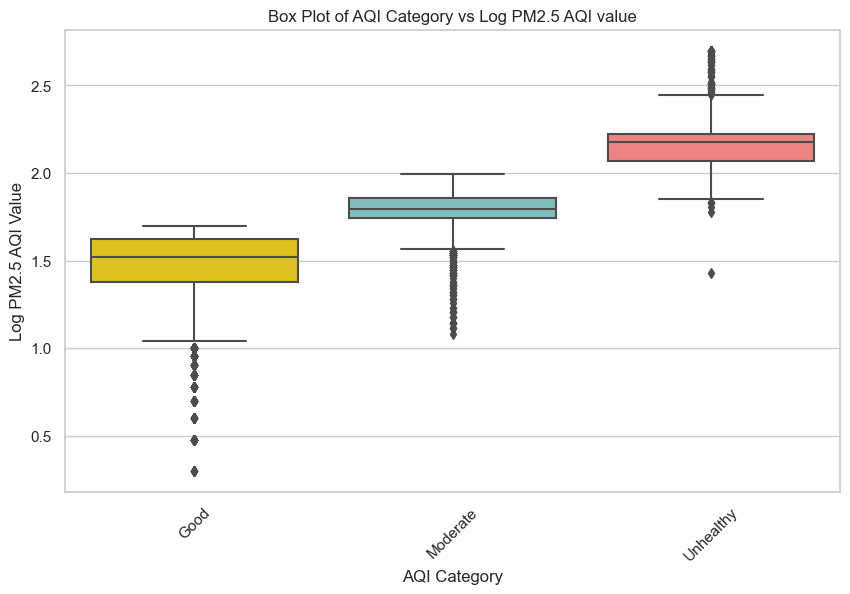

In [38]:
# Define the desired order of AQI categories
category_orderpm = ['Good', 'Moderate','Unhealthy for Sensitive Groups', 'Unhealthy','Very Unhealthy','Hazardous']
category_orderaqi = ['Good', 'Moderate','Unhealthy']

# Take the logarithm (base 10) of 'CO AQI Value'
df['Log_PM2.5_AQI_Value'] = df['PM2.5 AQI Value'].apply(lambda x: np.log10(x))

# Set the style for the plots
sns.set_style("whitegrid")

# Create a box plot of AQI Category vs Log CO AQI value
plt.figure(figsize=(10, 6))
sns.boxplot(x='AQI Category', y='Log_PM2.5_AQI_Value', data=df, order=category_orderaqi, palette=custom_colors2)
plt.xlabel('AQI Category')
plt.ylabel('Log PM2.5 AQI Value')
plt.title('Box Plot of AQI Category vs Log PM2.5 AQI value')
plt.xticks(rotation=45)
plt.show()

# Ozone

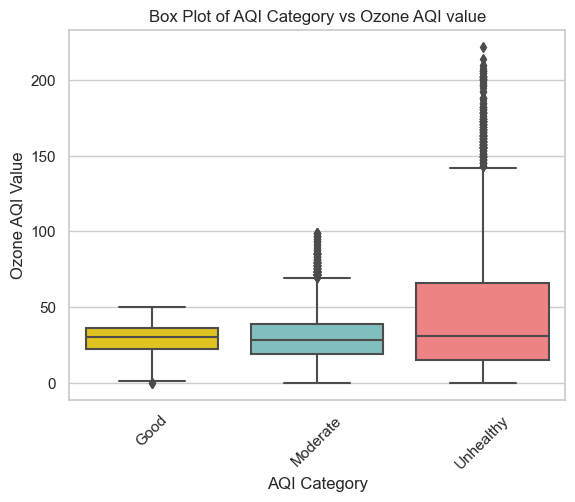

In [39]:
# Define the desired order of AQI categories
category_order = ['Good', 'Moderate', 'Unhealthy']

# Create a box plot of Ozone AQI Value vs AQI Category
sns.boxplot(x='AQI Category', y='Ozone AQI Value', data=df , order=category_order,palette=custom_colors2)

# Set the x-axis label
plt.xlabel('AQI Category')

# Set the y-axis label
plt.ylabel('Ozone AQI Value')

# Set the title of the box plot
plt.title('Box Plot of AQI Category vs Ozone AQI value')

# Rotate x-axis labels if needed
plt.xticks(rotation=45)

# Display the box plot
plt.show()

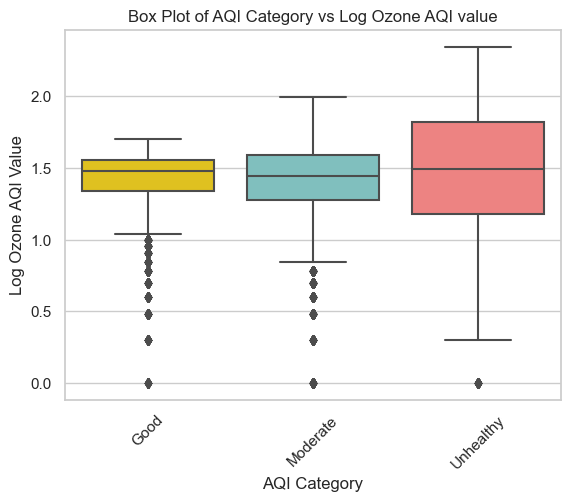

In [41]:
# Define the desired order of AQI categories
category_order = ['Good', 'Moderate', 'Unhealthy']

# Take the logarithm (base 10) of 'CO AQI Value'
df['Log_Ozone_AQI_Value'] = df['Ozone AQI Value'].apply(lambda x: np.log10(x))

# Create a box plot of Ozone AQI Value vs AQI Category
sns.boxplot(x='AQI Category', y='Log_Ozone_AQI_Value', data=df , order=category_order,palette=custom_colors2)

# Set the x-axis label
plt.xlabel('AQI Category')

# Set the y-axis label
plt.ylabel('Log Ozone AQI Value')

# Set the title of the box plot
plt.title('Box Plot of AQI Category vs Log Ozone AQI value')

# Rotate x-axis labels if needed
plt.xticks(rotation=45)

# Display the box plot
plt.show()

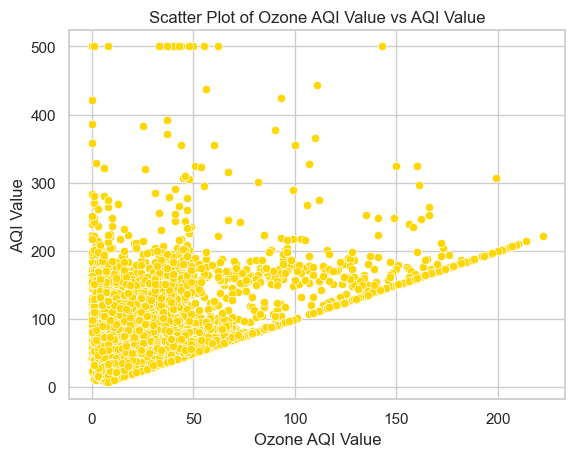

In [40]:

# Create a scatter plot of Ozone AQI Value vs AQI Value with hue by AQI Category
sns.scatterplot(x='Ozone AQI Value', y='AQI Value', data=df,color='#FFD700')

# Set the x-axis label
plt.xlabel('Ozone AQI Value')

# Set the y-axis label
plt.ylabel('AQI Value')

# Set the title of the scatter plot
plt.title('Scatter Plot of Ozone AQI Value vs AQI Value')

# Display the scatter plot
plt.show()

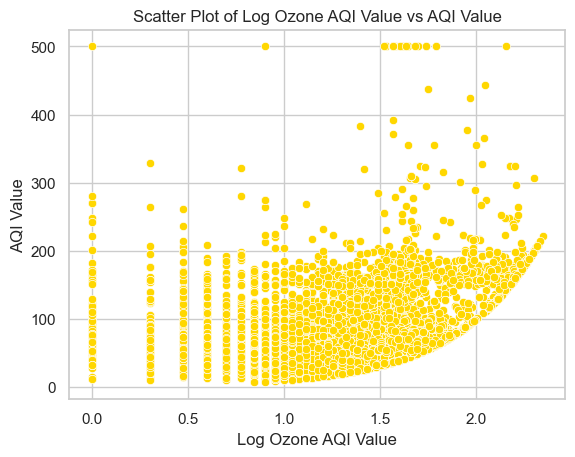

In [42]:

# Create a scatter plot of Ozone AQI Value vs AQI Value with hue by AQI Category
sns.scatterplot(x='Log_Ozone_AQI_Value', y='AQI Value', data=df,color='#FFD700')

# Set the x-axis label
plt.xlabel('Log Ozone AQI Value')

# Set the y-axis label
plt.ylabel('AQI Value')

# Set the title of the scatter plot
plt.title('Scatter Plot of Log Ozone AQI Value vs AQI Value')

# Display the scatter plot
plt.show()

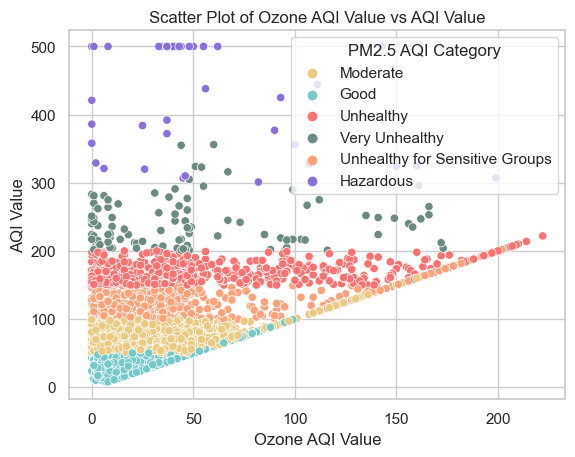

In [48]:
custom_colors6 = ['#ECC981', '#75C9C8', '#FF7170', '#6A8A82', '#FFA27A', '#8A6FDF']

# Create a scatter plot of Ozone AQI Value vs AQI Value with hue by AQI Category
sns.scatterplot(x='Ozone AQI Value', y='AQI Value', data=df,hue="PM2.5 AQI Category",palette=custom_colors6)

# Set the x-axis label
plt.xlabel('Ozone AQI Value')

# Set the y-axis label
plt.ylabel('AQI Value')

# Set the title of the scatter plot
plt.title('Scatter Plot of Ozone AQI Value vs AQI Value')

# Display the scatter plot
plt.show()

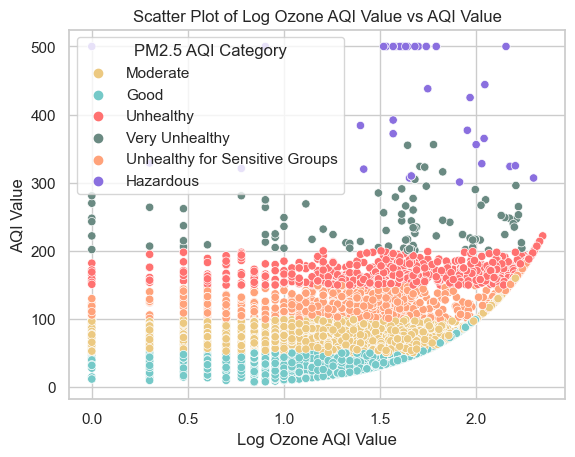

In [43]:
custom_colors6 = ['#ECC981', '#75C9C8', '#FF7170', '#6A8A82', '#FFA27A', '#8A6FDF']

# Create a scatter plot of Ozone AQI Value vs AQI Value with hue by AQI Category
sns.scatterplot(x='Log_Ozone_AQI_Value', y='AQI Value', data=df,hue="PM2.5 AQI Category",palette=custom_colors6)

# Set the x-axis label
plt.xlabel('Log Ozone AQI Value')

# Set the y-axis label
plt.ylabel('AQI Value')

# Set the title of the scatter plot
plt.title('Scatter Plot of Log Ozone AQI Value vs AQI Value')

# Display the scatter plot
plt.show()

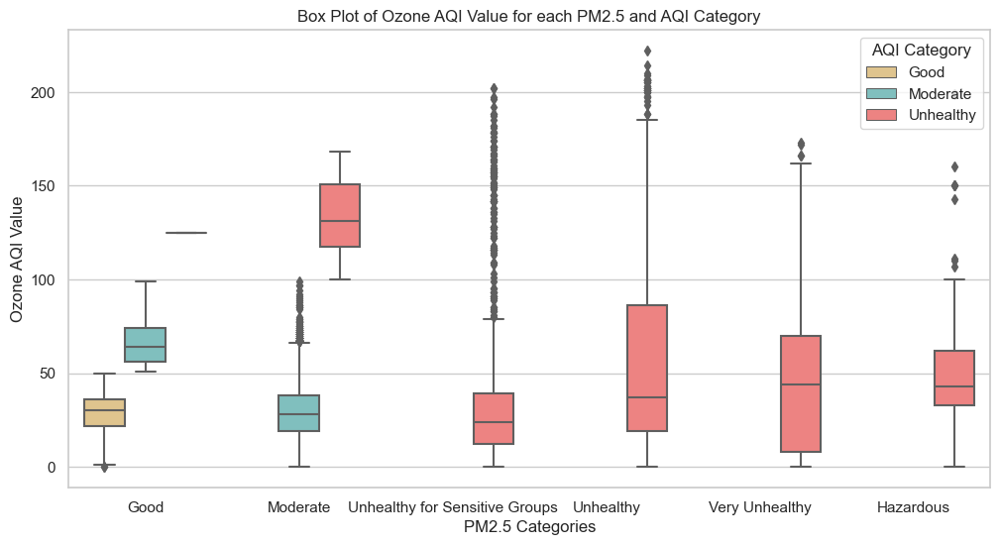

In [49]:
# Set the style for the plots
sns.set_style("whitegrid")

# Create a single box plot with updated PM2.5 categories, AQI categories, and Ozone AQI values
plt.figure(figsize=(12, 6))
sns.boxplot(x='PM2.5 AQI Category', y='Ozone AQI Value', hue='AQI Category',data=df, order=category_orderpm,hue_order=category_orderaqi, palette=custom_colors6)
plt.xlabel('PM2.5 Categories')

plt.ylabel('Ozone AQI Value')
plt.title('Box Plot of Ozone AQI Value for each PM2.5 and AQI Category')
plt.legend(title='AQI Category', loc='upper right')
plt.show()

## CO

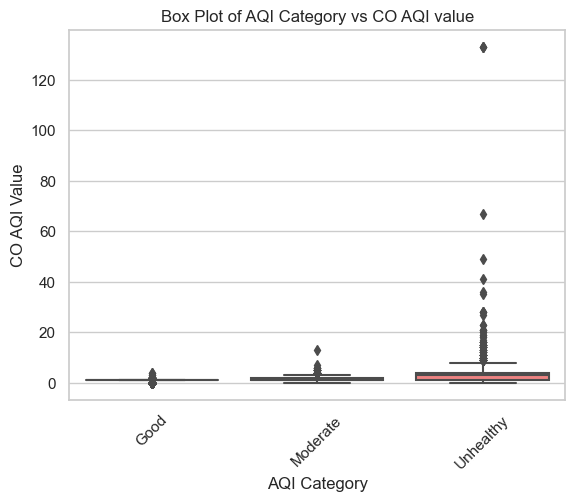

In [50]:
# Create a box plot of Ozone AQI Value vs AQI Category
sns.boxplot(x='AQI Category', y='CO AQI Value', data=df , order=category_orderaqi,palette=custom_colors2)
# Set the x-axis label
plt.xlabel('AQI Category')
# Set the y-axis label
plt.ylabel('CO AQI Value')
# Set the title of the box plot
plt.title('Box Plot of AQI Category vs CO AQI value')
# Rotate x-axis labels if needed
plt.xticks(rotation=45)
# Display the box plot
plt.show()

In [51]:
# Since distribution of CO AQI value is highly skewed take logrithm of it 

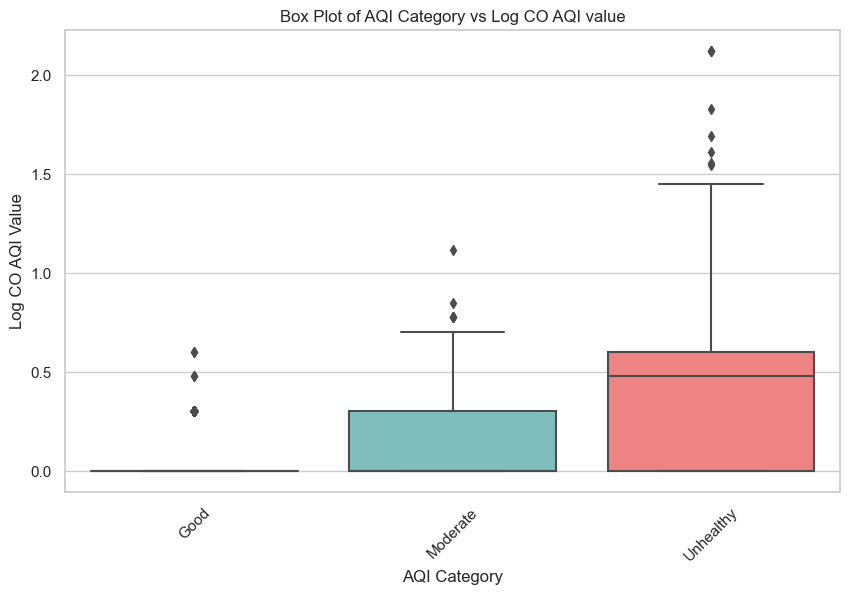

In [52]:
# Take the logarithm (base 10) of 'CO AQI Value'
df['Log_CO_AQI_Value'] = df['CO AQI Value'].apply(lambda x: np.log10(x))

# Set the style for the plots
sns.set_style("whitegrid")

# Create a box plot of AQI Category vs Log CO AQI value
plt.figure(figsize=(10, 6))
sns.boxplot(x='AQI Category', y='Log_CO_AQI_Value', data=df, order=category_orderaqi, palette=custom_colors2)
plt.xlabel('AQI Category')
plt.ylabel('Log CO AQI Value')
plt.title('Box Plot of AQI Category vs Log CO AQI value')
plt.xticks(rotation=45)
plt.show()

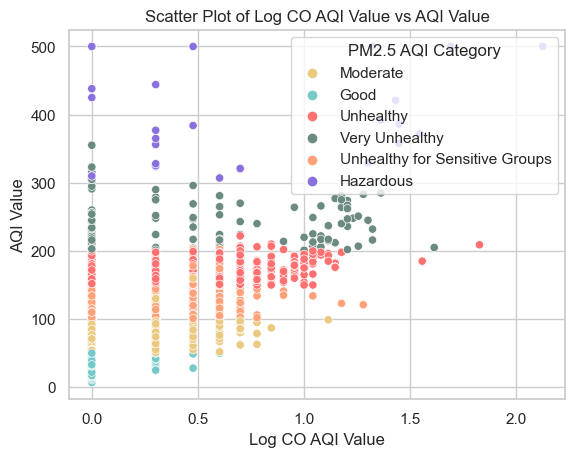

In [53]:

# Create a scatter plot of Ozone AQI Value vs AQI Value with hue by AQI Category
sns.scatterplot(x='Log_CO_AQI_Value', y='AQI Value', data=df,hue="PM2.5 AQI Category",palette=custom_colors6)

# Set the x-axis label
plt.xlabel('Log CO AQI Value')

# Set the y-axis label
plt.ylabel('AQI Value')

# Set the title of the scatter plot
plt.title('Scatter Plot of Log CO AQI Value vs AQI Value')

# Display the scatter plot
plt.show()

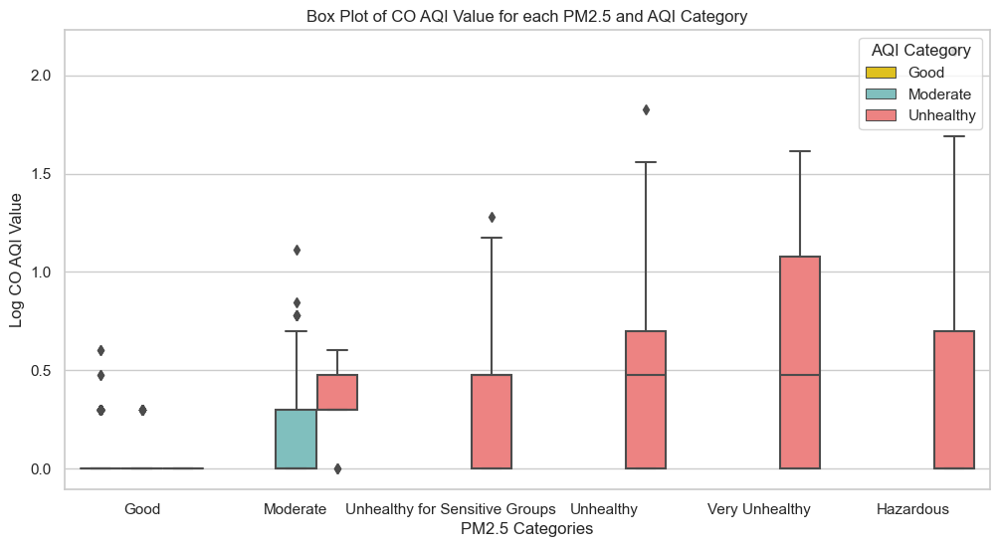

In [54]:
# Set the style for the plots
sns.set_style("whitegrid")

# Create a single box plot with updated PM2.5 categories, AQI categories, and Ozone AQI values
plt.figure(figsize=(12, 6))
sns.boxplot(x='PM2.5 AQI Category', y='Log_CO_AQI_Value', hue='AQI Category',data=df, order=category_orderpm,hue_order=category_orderaqi, palette=custom_colors2)
plt.xlabel('PM2.5 Categories')

plt.ylabel('Log CO AQI Value')
plt.title('Box Plot of CO AQI Value for each PM2.5 and AQI Category')
plt.legend(title='AQI Category', loc='upper right')
plt.show()

## NO2

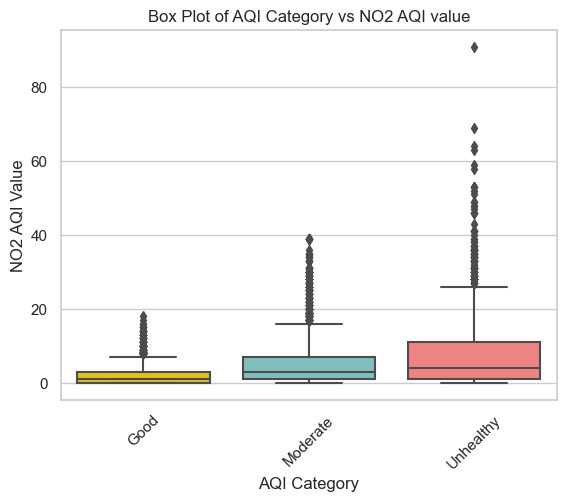

In [55]:
# Create a box plot of Ozone AQI Value vs AQI Category
sns.boxplot(x='AQI Category', y='NO2 AQI Value', data=df , order=category_orderaqi,palette=custom_colors2)
# Set the x-axis label
plt.xlabel('AQI Category')
# Set the y-axis label
plt.ylabel('NO2 AQI Value')
# Set the title of the box plot
plt.title('Box Plot of AQI Category vs NO2 AQI value')
# Rotate x-axis labels if needed
plt.xticks(rotation=45)
# Display the box plot
plt.show()

C:\Users\ACER.LAPTOP-9LUK3RE6\anaconda3\lib\site-packages\numpy\lib\function_base.py:4009: RuntimeWarning:

invalid value encountered in subtract



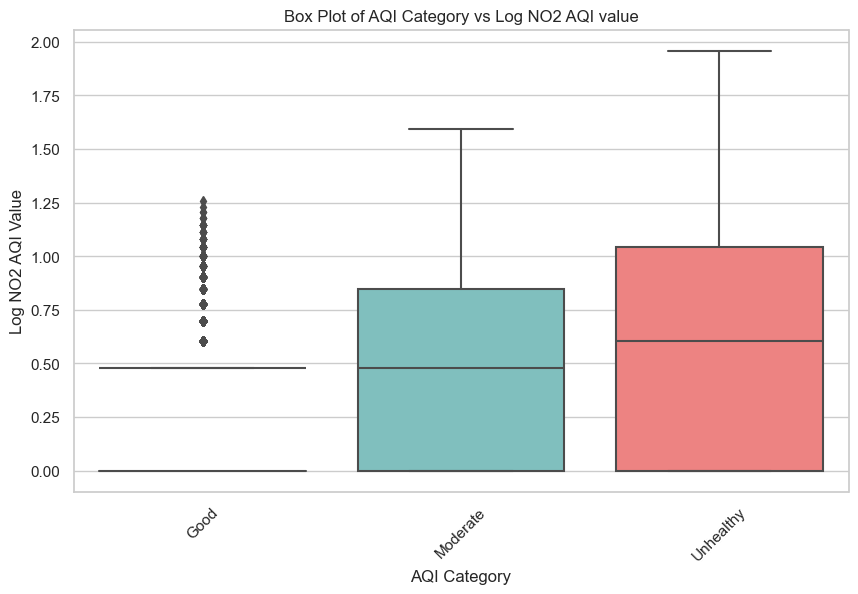

In [56]:
# Take the logarithm (base 10) of 'CO AQI Value'
df['Log_NO2_AQI_Value'] = df['NO2 AQI Value'].apply(lambda x: np.log10(x))

# Set the style for the plots
sns.set_style("whitegrid")

# Create a box plot of AQI Category vs Log CO AQI value
plt.figure(figsize=(10, 6))
sns.boxplot(x='AQI Category', y='Log_NO2_AQI_Value', data=df, order=category_orderaqi, palette=custom_colors2)
plt.xlabel('AQI Category')
plt.ylabel('Log NO2 AQI Value')
plt.title('Box Plot of AQI Category vs Log NO2 AQI value')
plt.xticks(rotation=45)
plt.show()

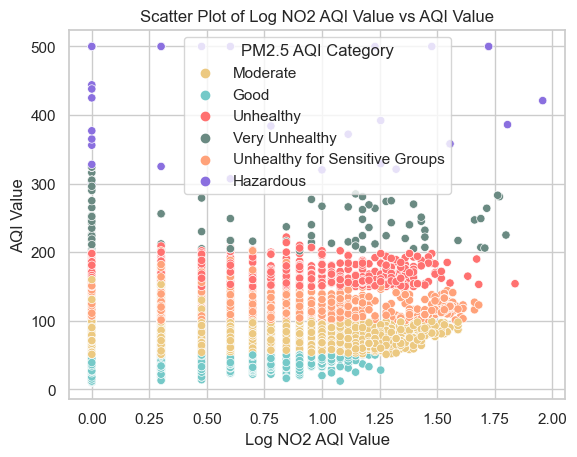

In [57]:
# Create a scatter plot of Ozone AQI Value vs AQI Value with hue by AQI Category
sns.scatterplot(x='Log_NO2_AQI_Value', y='AQI Value', data=df,hue="PM2.5 AQI Category",palette=custom_colors6)

# Set the x-axis label
plt.xlabel('Log NO2 AQI Value')

# Set the y-axis label
plt.ylabel('AQI Value')

# Set the title of the scatter plot
plt.title('Scatter Plot of Log NO2 AQI Value vs AQI Value')

# Display the scatter plot
plt.show()

C:\Users\ACER.LAPTOP-9LUK3RE6\anaconda3\lib\site-packages\numpy\lib\function_base.py:4009: RuntimeWarning:

invalid value encountered in subtract

C:\Users\ACER.LAPTOP-9LUK3RE6\anaconda3\lib\site-packages\numpy\lib\function_base.py:4009: RuntimeWarning:

invalid value encountered in subtract



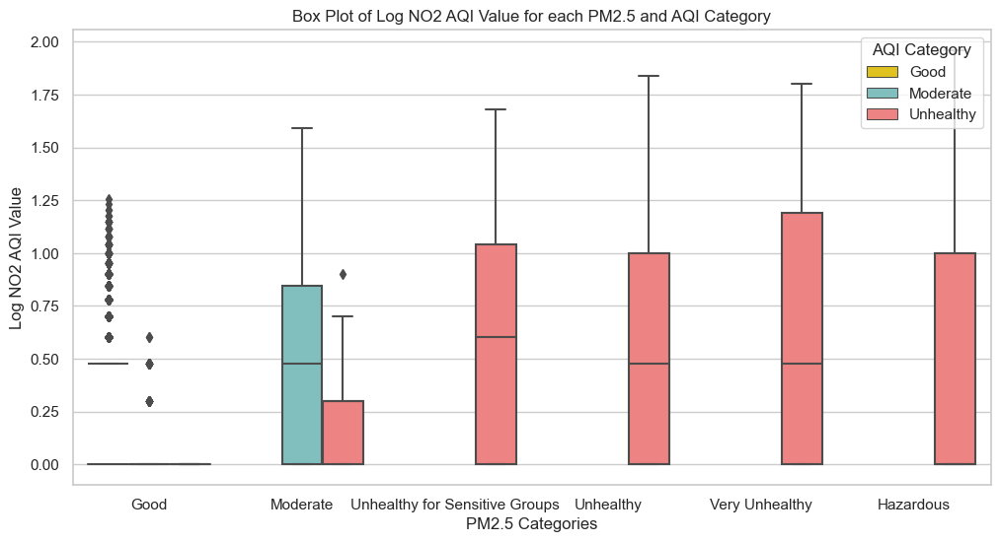

In [58]:

# Set the style for the plots
sns.set_style("whitegrid")

# Create a single box plot with updated PM2.5 categories, AQI categories, and Ozone AQI values
plt.figure(figsize=(12, 6))
sns.boxplot(x='PM2.5 AQI Category', y='Log_NO2_AQI_Value', hue='AQI Category',data=df, order=category_orderpm,hue_order=category_orderaqi, palette=custom_colors2)
plt.xlabel('PM2.5 Categories')

plt.ylabel('Log NO2 AQI Value')
plt.title('Box Plot of Log NO2 AQI Value for each PM2.5 and AQI Category')
plt.legend(title='AQI Category', loc='upper right')
plt.show()

## SO2

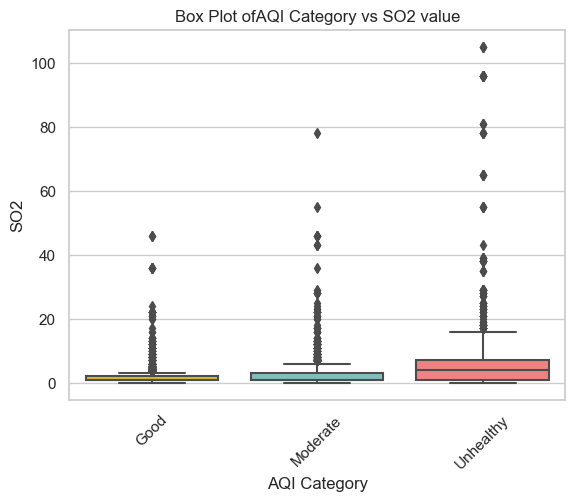

In [59]:
# Create a box plot of Ozone AQI Value vs AQI Category
sns.boxplot(x='AQI Category', y='SO2', data=df , order=category_orderaqi,palette=custom_colors2)
# Set the x-axis label
plt.xlabel('AQI Category')
# Set the y-axis label
plt.ylabel('SO2')
# Set the title of the box plot
plt.title('Box Plot ofAQI Category vs SO2 value')
# Rotate x-axis labels if needed
plt.xticks(rotation=45)
# Display the box plot
plt.show()

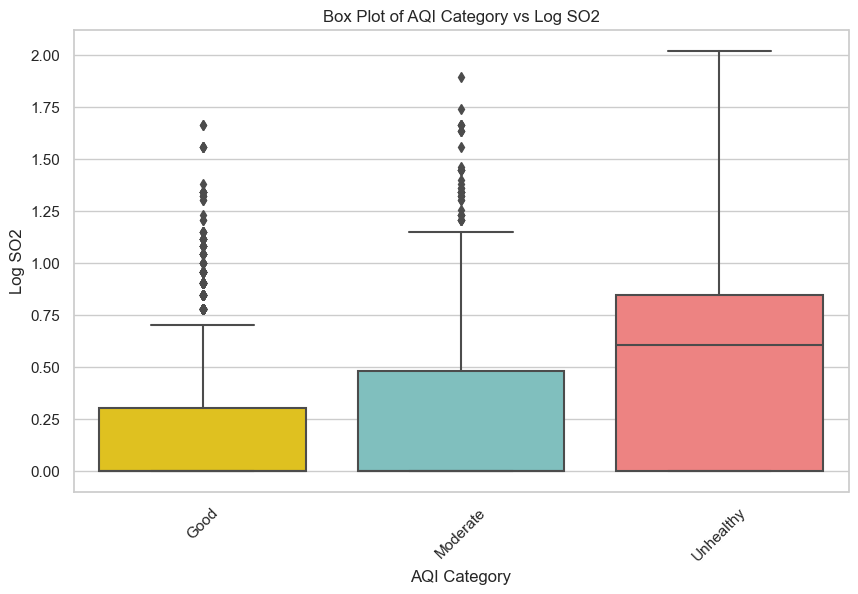

In [60]:
# Take the logarithm (base 10) of 'CO AQI Value'
df['Log_SO2'] = df['SO2'].apply(lambda x: np.log10(x))

# Set the style for the plots
sns.set_style("whitegrid")

# Create a box plot of AQI Category vs Log CO AQI value
plt.figure(figsize=(10, 6))
sns.boxplot(x='AQI Category', y='Log_SO2', data=df, order=category_orderaqi, palette=custom_colors2)
plt.xlabel('AQI Category')
plt.ylabel('Log SO2')
plt.title('Box Plot of AQI Category vs Log SO2')
plt.xticks(rotation=45)
plt.show()

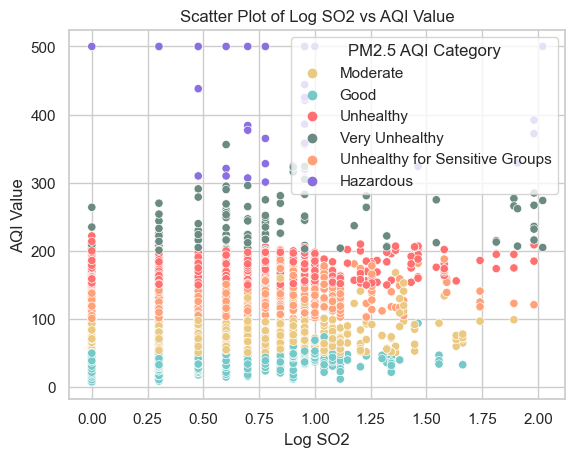

In [61]:
# Create a scatter plot of Ozone AQI Value vs AQI Value with hue by AQI Category
sns.scatterplot(x='Log_SO2', y='AQI Value', data=df,hue="PM2.5 AQI Category",palette=custom_colors6)

# Set the x-axis label
plt.xlabel('Log SO2')

# Set the y-axis label
plt.ylabel('AQI Value')

# Set the title of the scatter plot
plt.title('Scatter Plot of Log SO2 vs AQI Value')

# Display the scatter plot
plt.show()

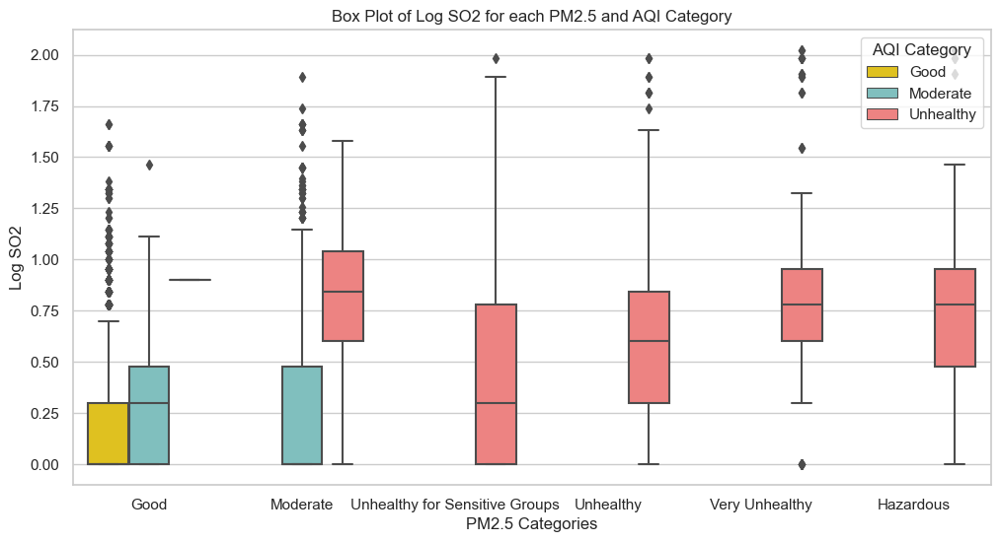

In [62]:
# Set the style for the plots
sns.set_style("whitegrid")

# Create a single box plot with updated PM2.5 categories, AQI categories, and Ozone AQI values
plt.figure(figsize=(12, 6))
sns.boxplot(x='PM2.5 AQI Category', y='Log_SO2', hue='AQI Category',data=df, order=category_orderpm,hue_order=category_orderaqi, palette=custom_colors2)
plt.xlabel('PM2.5 Categories')

plt.ylabel('Log SO2')
plt.title('Box Plot of Log SO2 for each PM2.5 and AQI Category')
plt.legend(title='AQI Category', loc='upper right')
plt.show()

# PCA

In [63]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Assuming X and Y are pandas DataFrame objects
x = df[['CO AQI Value', 'Ozone AQI Value', 'NO2 AQI Value', 'PM2.5 AQI Value','SO2']]
y = df['AQI Category']

scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)

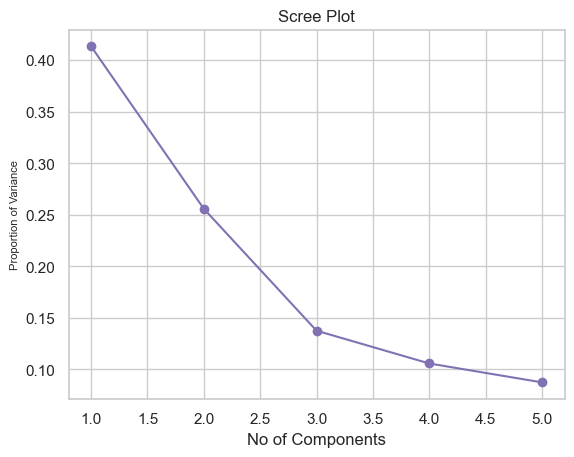

In [64]:
pca = PCA(n_components=5)
pca.fit_transform(x_scaled)

prop_var = pca.explained_variance_ratio_
PC_numbers = np.arange(pca.n_components_) + 1
 
plt.plot(PC_numbers, 
         prop_var, 
         'mo-')
plt.title('Scree Plot', fontsize=12)
plt.ylabel('Proportion of Variance', fontsize=8)
plt.xlabel("No of Components")
plt.show()

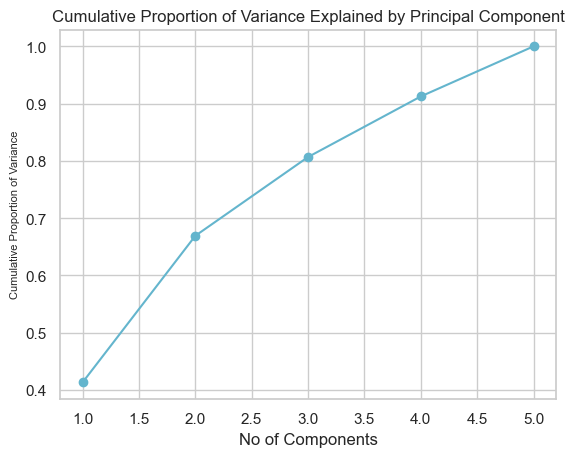

In [65]:
cum_var = pca.explained_variance_ratio_.cumsum()
plt.plot(PC_numbers, 
         cum_var, 
         'co-')
plt.title('Cumulative Proportion of Variance Explained by Principal Component', fontsize=12)
plt.ylabel('Cumulative Proportion of Variance', fontsize=8)
plt.xlabel("No of Components")
plt.show()

In [66]:
cum_var

array([0.41341781, 0.66927669, 0.80683696, 0.91258263, 1.        ])

In [67]:
pca = PCA(n_components=3)
pca_features = pca.fit_transform(x_scaled)

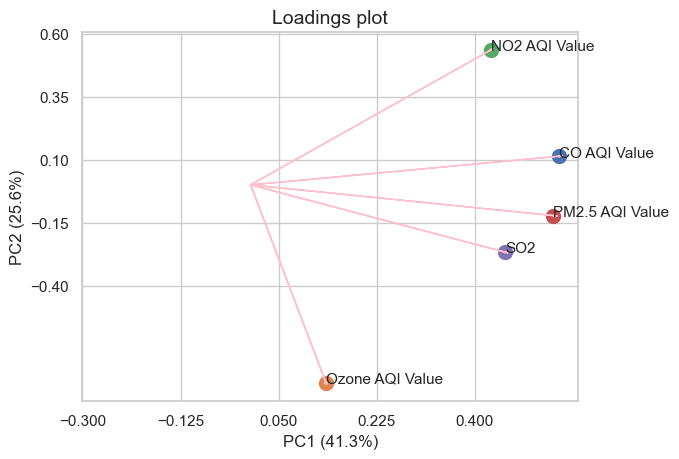

In [68]:
loadings = pca.components_
feature_names = x

# Get the loadings of x and y axes
xs = loadings[0]
ys = loadings[1]
 
# Plot the loadings on a scatterplot
for i, varnames in enumerate(feature_names):
    plt.scatter(xs[i], ys[i], s=100)
    plt.arrow(
        0, 0, # coordinates of arrow base
        xs[i], # length of the arrow along x
        ys[i], # length of the arrow along y
        color='pink', 
        head_width=0.005
        )
    plt.text(xs[i], ys[i], varnames, fontsize = 11)
 
# Define the axes
xticks = np.linspace(-0.3, 0.4, num=5)
yticks = np.linspace(-0.4, 0.6, num=5)
plt.xticks(xticks)
plt.yticks(yticks)
plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.1f}%)')
plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.1f}%)')

plt.title('Loadings plot', fontsize = 14)
plt.show()

In [69]:
pca_df = pd.DataFrame(
    data=pca_features, 
    columns=['PC1', 'PC2', 'PC3'])
  
pca_df['target'] = np.array(df['AQI Category'])

pca_df.head(10)

,PC1,PC2,PC3,target
0,-0.574414,-0.407178,-0.126819,Moderate
1,-0.808662,0.776245,0.313640,Good
2,-0.902770,0.831589,0.145102,Good
3,-0.223634,-0.370384,-0.362089,Moderate
4,-0.973533,-0.251156,0.271883,Good
5,0.041143,1.396264,-0.212609,Moderate
6,0.041143,1.396264,-0.212609,Moderate
7,0.339236,0.267654,0.222094,Moderate
8,-0.434689,-0.496252,-0.226814,Moderate
9,0.381960,-1.607894,0.092804,Moderate


In [70]:
pca_df['target'] = pca_df['target'].astype('category')

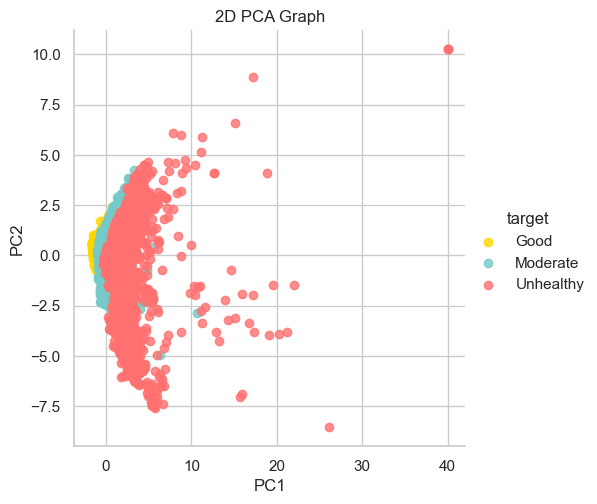

In [71]:
# Score Plot
sns.lmplot(
    x='PC1', 
    y='PC2', 
    data=pca_df, 
    hue='target', 
    palette=custom_colors2,
    fit_reg=False, 
    legend=True
    )
 
plt.title('2D PCA Graph')
plt.show()


In [72]:
total_var = pca.explained_variance_ratio_[:2].sum() * 100
fig = px.scatter_3d(pca_df, x='PC1', y='PC2', z='PC3',
              color='target', title=f'Total Explained Variance: {total_var:.2f}%')
fig.update_traces(marker=dict(size=4))
fig.show()

# PLS

In [73]:
from sklearn.cross_decomposition import PLSRegression
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

# Assuming X and Y are pandas DataFrame objects
X = df[['CO AQI Value', 'Ozone AQI Value', 'NO2 AQI Value', 'PM2.5 AQI Value', 'SO2']]
Y = df['AQI Category']

# Convert the ordinal response variable to numerical values
Y_numerical = Y.map({'Good': 1, 'Moderate': 2, 'Unhealthy': 3})

# Standardize the predictor variables
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split the data into training and testing sets
X_train, X_test, Y_train, Y_test = train_test_split(X_scaled, Y_numerical, test_size=0.2, random_state=42)

# Create and fit the PLS regression model
pls = PLSRegression(n_components=2)
pls.fit(X_train, Y_train)

# Calculate the PLS scores
X_scores = pls.transform(X_scaled)

# Predict on the test set
Y_pred = pls.predict(X_test)

# Convert the numerical predictions back to the ordinal categories
Y_pred_category = pd.cut(Y_pred.flatten(), bins=[0, 1.5, 2.5, 3.5], labels=['Good', 'Moderate', 'Unhealthy'])

# Evaluate the model
mse = mean_squared_error(Y_test, Y_pred)
r2 = r2_score(Y_test, Y_pred)

print(f'Mean Squared Error: {mse}')
print(f'R-squared: {r2}')


Mean Squared Error: 0.15286112660113008
R-squared: 0.6491833066455305


In [74]:
x_loadings=pls.x_loadings_
y_loadings=pls.y_loadings_

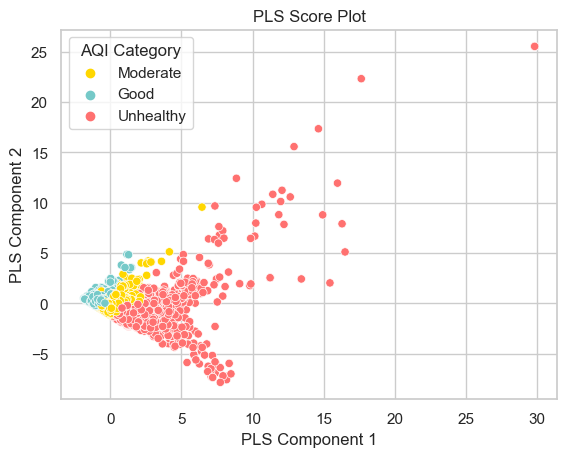

In [75]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create a scatter plot with Seaborn
sns.scatterplot(x=X_scores[:, 0], y=X_scores[:, 1], hue=Y, palette=custom_colors2)

# Customize the plot
plt.xlabel('PLS Component 1')
plt.ylabel('PLS Component 2')
plt.title('PLS Score Plot')
plt.legend(title='AQI Category')
plt.show()

In [76]:
# Get the scores of the first two components
scores = pls.x_scores_[:, :2]

# Calculate the total variance of the input data
total_variance = np.var(X_train, axis=0).sum()

# Calculate the variance of the scores
scores_variance = np.var(scores, axis=0).sum()
scores_variance

# Calculate the proportion of variance explained by the first two components
variance_explained = scores_variance / total_variance

print(f"Variance explained by the first two components: {variance_explained * 100}%")

Variance explained by the first two components: 50.71641650227225%


In [77]:
loadings = pd.DataFrame(pls.x_loadings_)
num_features = X_train.shape[1]  # Number of features in your dataset
num_components = loadings.shape[1]  # Number of PLS components

In [78]:
loadings.shape

(5, 2)

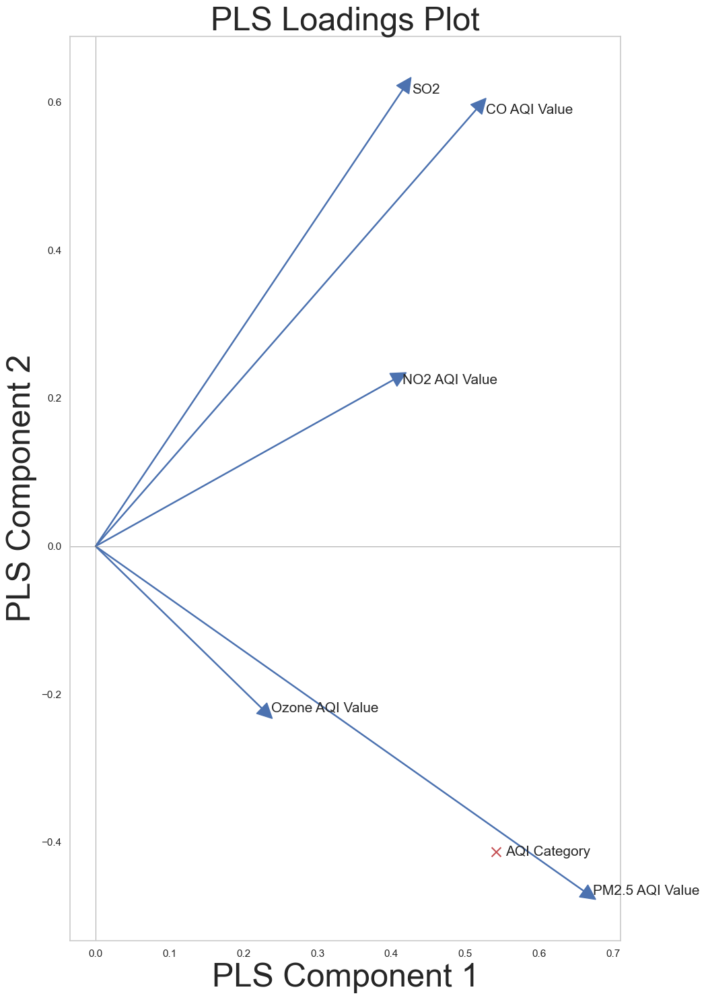

In [79]:
plt.figure(figsize=(15, 15))
feature_names = X.columns.tolist()

# Plot predictor variable loadings
for i in range(num_features):
    plt.arrow(0, 0, x_loadings[i, 0], x_loadings[i, 1], head_width=0.02, head_length=0.02, fc='b', ec='b')
    plt.annotate(feature_names[i], xy=(x_loadings[i, 0], x_loadings[i, 1]), xytext=(10, 0), textcoords='offset points', ha='left', va='center', fontsize=15)

# Plot response variable loading (as a red cross)
plt.scatter(y_loadings[0, 0], y_loadings[0, 1], color='r', marker='x', s=100)
plt.annotate('AQI Category', xy=(y_loadings[0, 0], y_loadings[0, 1]), xytext=(10, 0), textcoords='offset points', ha='left', va='center', fontsize=15)

plt.gca().set_aspect('equal', adjustable='box')
plt.xlabel('PLS Component 1', fontsize=35)
plt.ylabel('PLS Component 2', fontsize=35)
plt.title('PLS Loadings Plot', fontsize=35)
plt.grid()
plt.axhline(0, color='gray', linewidth=0.5)
plt.axvline(0, color='gray', linewidth=0.5)
plt.tight_layout()
plt.show()

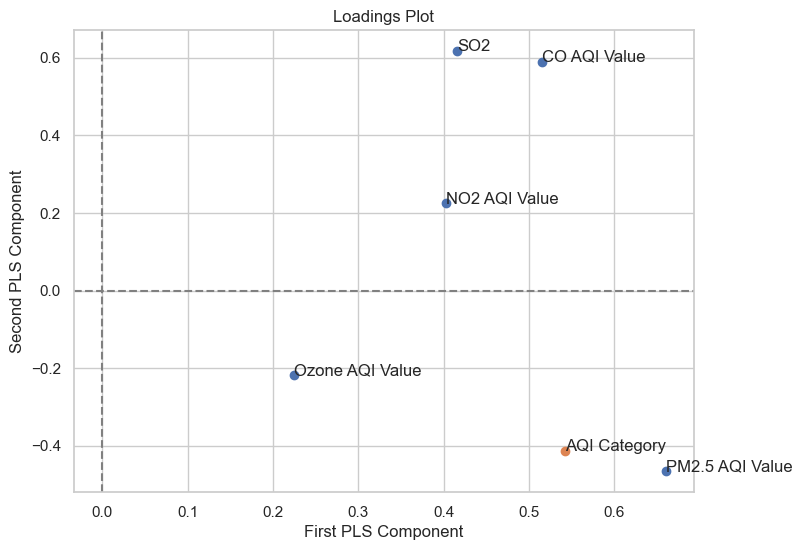

In [80]:
ig, ax = plt.subplots(figsize=(8, 6))
plt.scatter(pls.x_loadings_[:, 0], pls.x_loadings_[:, 1])
plt.scatter(pls.y_loadings_[:, 0], pls.y_loadings_[:, 1])
plt.xlabel('First PLS Component')
plt.ylabel('Second PLS Component')
plt.title('Loadings Plot')

# Annotate the input features
input_features = ['CO AQI Value', 'Ozone AQI Value', 'NO2 AQI Value', 'PM2.5 AQI Value', 'SO2']
for i, var in enumerate(input_features):
    plt.annotate(var, (pls.x_loadings_[i, 0], pls.x_loadings_[i, 1]))

# Annotate the output feature
plt.annotate('AQI Category', (pls.y_loadings_[0, 0], pls.y_loadings_[0, 1]))

# Add horizontal and vertical lines at zero
ax.axhline(y=0, linestyle='--', color='gray')
ax.axvline(x=0, linestyle='--', color='gray')

plt.show()

C:\Users\ACER.LAPTOP-9LUK3RE6\anaconda3\lib\site-packages\sklearn\cross_decomposition\_pls.py:503: FutureWarning:

The attribute `coef_` will be transposed in version 1.3 to be consistent with other linear models in scikit-learn. Currently, `coef_` has a shape of (n_features, n_targets) and in the future it will have a shape of (n_targets, n_features).



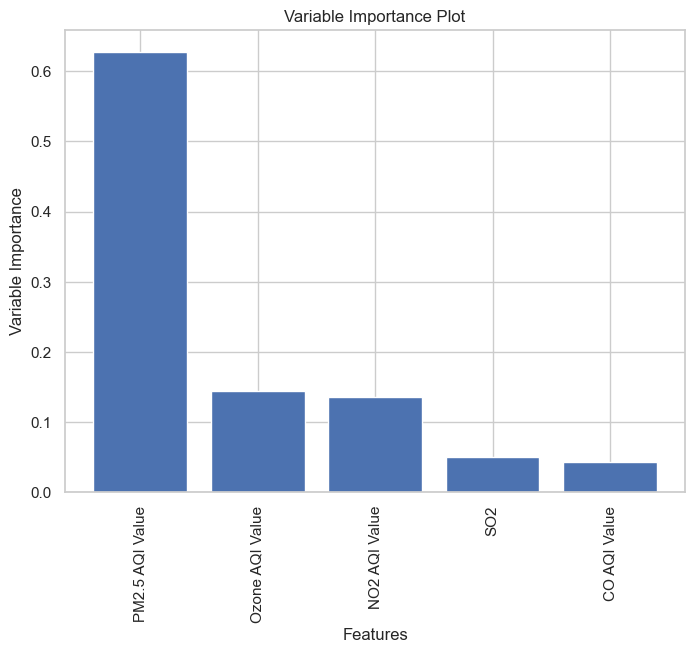

In [81]:
# Calculate the variable importance scores
vip = np.abs(pls.coef_).sum(axis=1)

# Normalize the scores
vip /= vip.sum()

# Sort the scores in descending order and get the corresponding feature names
sorted_idx = np.argsort(vip)[::-1]
sorted_features = np.array(['CO AQI Value', 'Ozone AQI Value', 'NO2 AQI Value', 'PM2.5 AQI Value','SO2'])[sorted_idx]

# Plot the scores
plt.figure(figsize=(8, 6))
plt.bar(sorted_features, vip[sorted_idx], color='b')
plt.xticks(rotation=90)
plt.xlabel('Features')
plt.ylabel('Variable Importance')
plt.title('Variable Importance Plot')
plt.show()

## Clustering

In [82]:
from sklearn.cluster import KMeans

cs = []
for i in range(1,11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
    kmeans.fit(x_scaled)
    cs.append(kmeans.inertia_)

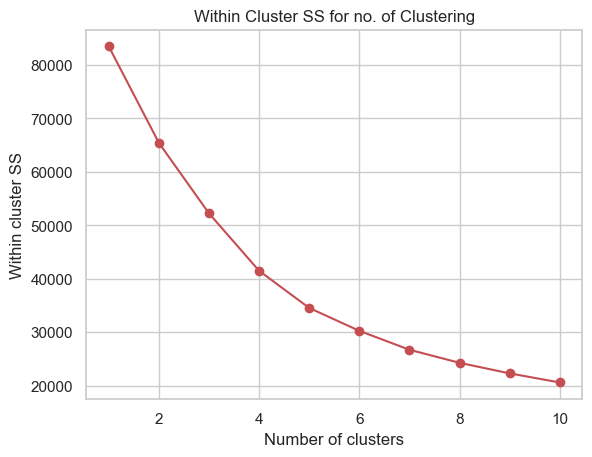

In [83]:
plt.plot(range(1, 11), cs, 'ro-')
plt.title('Within Cluster SS for no. of Clustering')
plt.xlabel('Number of clusters')
plt.ylabel('Within cluster SS')
plt.show()

In [84]:
from sklearn.metrics import silhouette_score
silhouette_avg = []
for num_clusters in range(2, 5):
 kmeans = KMeans(n_clusters=num_clusters, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
 kmeans.fit(x_scaled)
 cluster_labels = kmeans.labels_
 silhouette_avg.append(silhouette_score(x_scaled, cluster_labels))

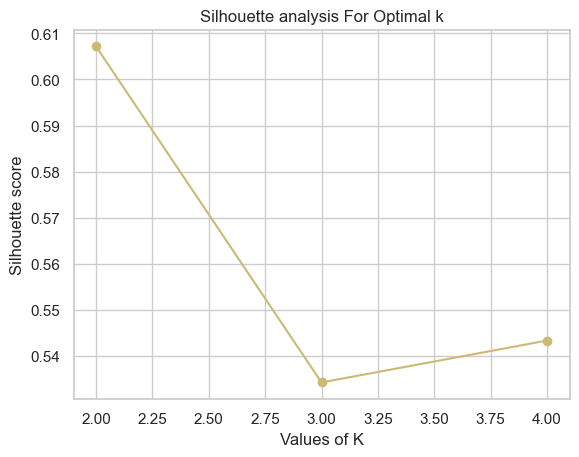

In [85]:
plt.plot(range(2,5),silhouette_avg,'yo-')
plt.xlabel('Values of K') 
plt.ylabel('Silhouette score') 
plt.title('Silhouette analysis For Optimal k')
plt.show()

In [86]:
kmeans = KMeans(n_clusters=3,random_state=0)
kmeans.fit(x_scaled)
label = kmeans.fit_predict(x)
u_labels = np.unique(label)

C:\Users\ACER.LAPTOP-9LUK3RE6\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\ACER.LAPTOP-9LUK3RE6\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



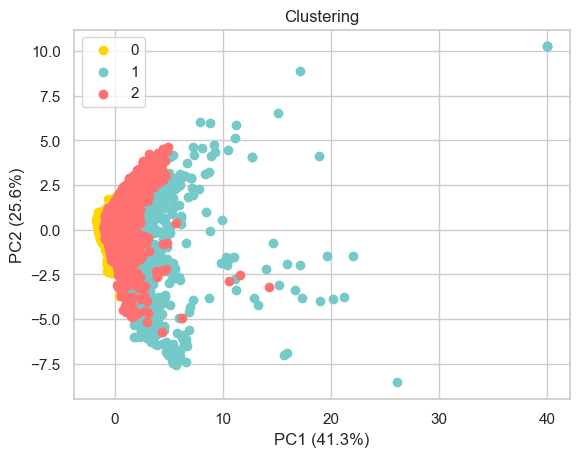

In [87]:
for i, color in zip(u_labels, custom_colors2):
    plt.scatter(
        pca_df[label == i]['PC1'],
        pca_df[label == i]['PC2'],
        label=i,
        color=color  # Use custom color for each label
    )

plt.title('Clustering')
plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0] * 100:.1f}%)')
plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1] * 100:.1f}%)')
plt.legend()
plt.show()



In [88]:
df['Cluster'] = label
df.head()

,Country,City,AQI Value,AQI Category,CO AQI Value,CO AQI Category,Ozone AQI Value,Ozone AQI Category,NO2 AQI Value,NO2 AQI Category,...,lat,lng,SO2,Continent,AQI Category Numerical,Log_PM2.5_AQI_Value,Log_CO_AQI_Value,Log_NO2_AQI_Value,Log_SO2,Cluster
0,Russian Federation,Praskoveya,51,Moderate,1,Good,36,Good,0,Good,...,44.7444,44.2031,1,Europe,2,1.707570,0.0,-inf,0.0,0
1,Brazil,Presidente Dutra,41,Good,1,Good,5,Good,1,Good,...,-5.2900,-44.4900,1,South America,1,1.612784,0.0,0.00000,0.0,0
2,Brazil,Presidente Dutra,41,Good,1,Good,5,Good,1,Good,...,-11.2958,-41.9869,0,South America,1,1.612784,0.0,0.00000,-inf,0
3,Italy,Priolo Gargallo,66,Moderate,1,Good,39,Good,2,Good,...,37.1667,15.1833,1,Europe,2,1.819544,0.0,0.30103,0.0,2
4,Poland,Przasnysz,34,Good,1,Good,34,Good,0,Good,...,53.0167,20.8833,1,Europe,1,1.301030,0.0,-inf,0.0,0


In [89]:
df.groupby('Cluster').mean()

,AQI Value,CO AQI Value,Ozone AQI Value,NO2 AQI Value,PM2.5 AQI Value,lat,lng,SO2,AQI Category Numerical,Log_PM2.5_AQI_Value,Log_CO_AQI_Value,Log_NO2_AQI_Value,Log_SO2
Cluster,,,,,,,,,,,,,
0,38.188331,0.807976,30.260586,1.763171,32.891433,32.078163,-2.287270,1.657681,1.057361,NaN,NaN,NaN,NaN
1,176.752212,3.960914,60.590708,6.882006,171.428466,20.932904,49.217969,7.267699,3.000000,2.217183,NaN,NaN,NaN
2,69.555787,1.451421,28.046847,5.559667,69.168399,29.982262,-15.801934,2.315454,2.073042,1.828766,NaN,NaN,NaN


In [90]:
pd.crosstab(df['AQI Category'], df['Cluster'])

Cluster,0,1,2
AQI Category,,,
Good,7659,0,49
Moderate,464,0,6590
Unhealthy,1,1356,576


# PLS with onehot encoded continent

In [91]:
from sklearn.cross_decomposition import PLSRegression
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

# Assuming X and Y are pandas DataFrame objects
X = df[['CO AQI Value', 'Ozone AQI Value', 'NO2 AQI Value', 'PM2.5 AQI Value', 'SO2', 'Continent']]
Y = df['AQI Category']

# Convert the ordinal response variable to numerical values
Y_numerical = Y.map({'Good': 1, 'Moderate': 2, 'Unhealthy': 3})

# Standardize the predictor variables except for 'Continent'
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X.iloc[:, :-1])  # Exclude 'Continent'

# One-hot encode the 'Continent' variable
encoder = OneHotEncoder()
continent_encoded = encoder.fit_transform(X[['Continent']]).toarray()

# Get the names of the one-hot encoded columns
encoded_column_names = encoder.get_feature_names_out(['Continent'])

# Combine the one-hot encoded column names with the rest of the feature names
all_feature_names = X.columns.tolist()[:-1] + encoded_column_names.tolist()

# Combine scaled predictor variables and one-hot encoded 'Continent'
X_scaled = np.hstack((X_scaled, continent_encoded))

# Split the data into training and testing sets
X_train, X_test, Y_train, Y_test = train_test_split(X_scaled, Y_numerical, test_size=0.2, random_state=42)

# Create and fit the PLS regression model
pls = PLSRegression(n_components=2)
pls.fit(X_train, Y_train)

# Calculate the PLS scores
X_scores = pls.transform(X_scaled)

# Predict on the test set
Y_pred = pls.predict(X_test)

# Convert the numerical predictions back to the ordinal categories
Y_pred_category = pd.cut(Y_pred.flatten(), bins=[0, 1.5, 2.5, 3.5], labels=['Good', 'Moderate', 'Unhealthy'])

# Evaluate the model
mse = mean_squared_error(Y_test, Y_pred)
r2 = r2_score(Y_test, Y_pred)

print(f'Mean Squared Error: {mse}')
print(f'R-squared: {r2}')


Mean Squared Error: 0.1532699731632137
R-squared: 0.6482450026948225


In [92]:
x_loadings=pls.x_loadings_
y_loadings=pls.y_loadings_

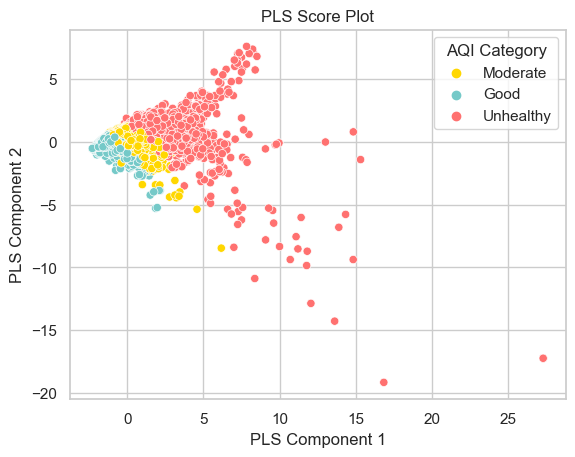

In [93]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create a scatter plot with Seaborn
sns.scatterplot(x=X_scores[:, 0], y=X_scores[:, 1], hue=Y, palette=custom_colors2)

# Customize the plot
plt.xlabel('PLS Component 1')
plt.ylabel('PLS Component 2')
plt.title('PLS Score Plot')
plt.legend(title='AQI Category')
plt.show()


In [94]:
# Get the scores of the first two components
scores = pls.x_scores_[:, :2]

# Calculate the total variance of the input data
total_variance = np.var(X_train, axis=0).sum()

# Calculate the variance of the scores
scores_variance = np.var(scores, axis=0).sum()
scores_variance

# Calculate the proportion of variance explained by the first two components
variance_explained = scores_variance / total_variance

print(f"Variance explained by the first two components: {variance_explained * 100}%")

Variance explained by the first two components: 49.29782184302109%


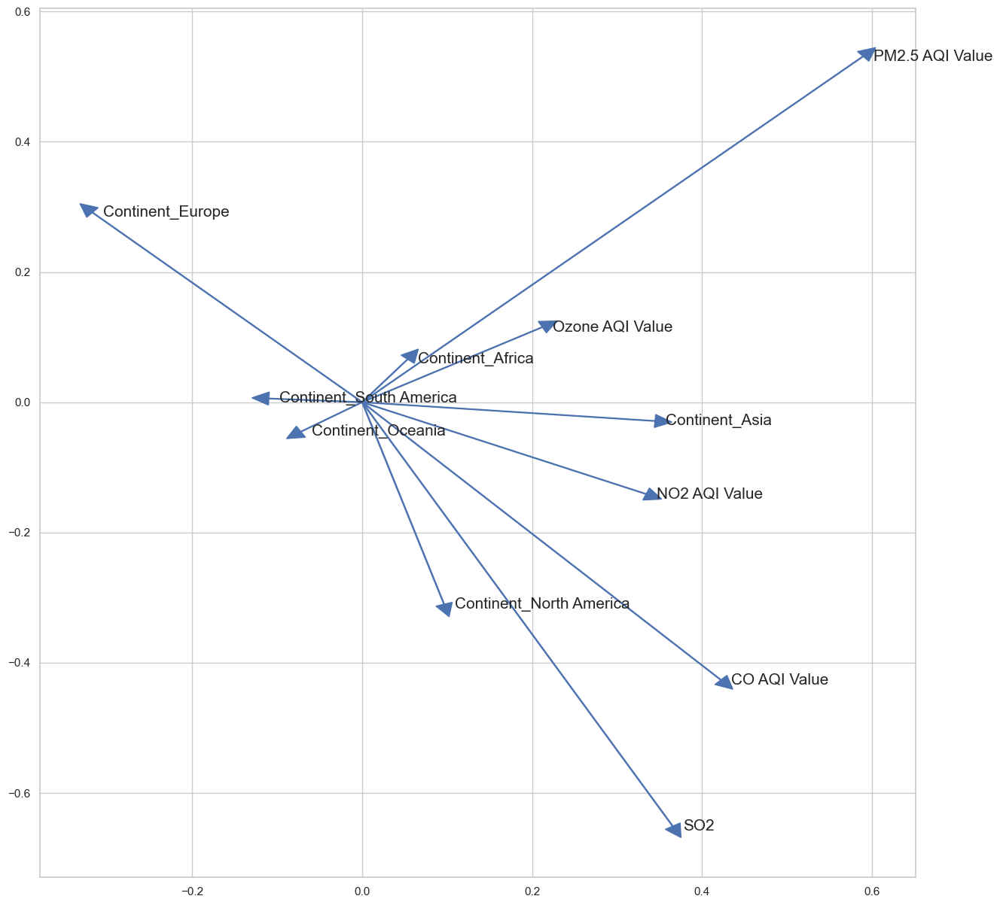

In [95]:
loadings = pd.DataFrame(pls.x_loadings_)
num_features = len(all_feature_names) # Number of features in your dataset
num_components = loadings.shape[1]  # Number of PLS components

plt.figure(figsize=(15, 15))
feature_names = all_feature_names # Use the correct variable name 'X'

# Plot predictor variable loadings
for i in range(num_features):
    plt.arrow(0, 0, loadings.iloc[i, 0], loadings.iloc[i, 1], head_width=0.02, head_length=0.02, fc='b', ec='b')  # Use 'loadings' instead of 'x_loadings'
    plt.annotate(feature_names[i], xy=(loadings.iloc[i, 0], loadings.iloc[i, 1]), xytext=(10, 0), textcoords='offset points', ha='left', va='center', fontsize=15)  # Use 'loadings' instead of 'x_loadings'

plt.show()


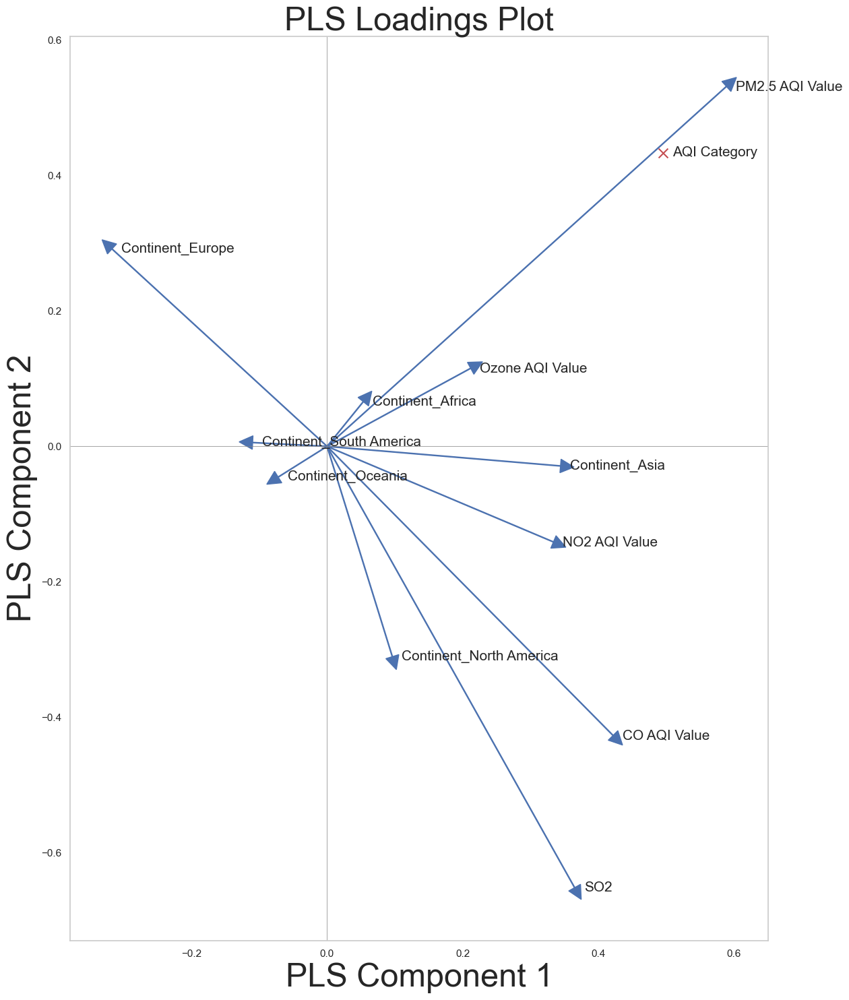

In [96]:
loadings = pd.DataFrame(pls.x_loadings_)
num_features = len(all_feature_names)  # Number of features in your dataset
num_components = loadings.shape[1]  # Number of PLS components

plt.figure(figsize=(15, 15))
feature_names = all_feature_names  # Use the correct variable name 'all_feature_names'

# Plot predictor variable loadings
for i in range(num_features):
    plt.arrow(0, 0, loadings.iloc[i, 0], loadings.iloc[i, 1], head_width=0.02, head_length=0.02, fc='b', ec='b')
    plt.annotate(feature_names[i], xy=(loadings.iloc[i, 0], loadings.iloc[i, 1]), xytext=(10, 0), textcoords='offset points', ha='left', va='center', fontsize=15)

# Plot response variable loading (as a red cross)
plt.scatter(pls.y_loadings_[0, 0], pls.y_loadings_[0, 1], color='r', marker='x', s=100)
plt.annotate('AQI Category', xy=(pls.y_loadings_[0, 0], pls.y_loadings_[0, 1]), xytext=(10, 0), textcoords='offset points', ha='left', va='center', fontsize=15)

plt.gca().set_aspect('equal', adjustable='box')
plt.xlabel('PLS Component 1', fontsize=35)
plt.ylabel('PLS Component 2', fontsize=35)
plt.title('PLS Loadings Plot', fontsize=35)
plt.grid()
plt.axhline(0, color='gray', linewidth=0.5)
plt.axvline(0, color='gray', linewidth=0.5)
plt.tight_layout()
plt.show()


In [97]:
all_feature_names 

['CO AQI Value',
 'Ozone AQI Value',
 'NO2 AQI Value',
 'PM2.5 AQI Value',
 'SO2',
 'Continent_Africa',
 'Continent_Asia',
 'Continent_Europe',
 'Continent_North America',
 'Continent_Oceania',
 'Continent_South America']

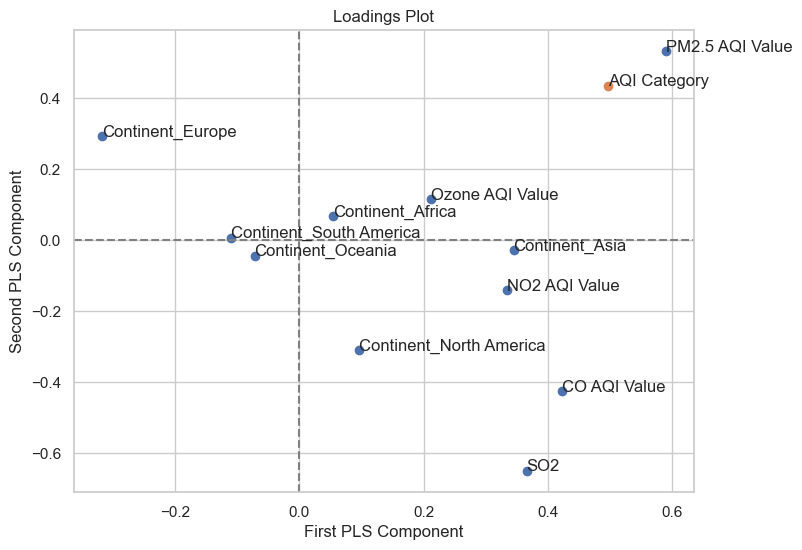

In [98]:
ig, ax = plt.subplots(figsize=(8, 6))

# Scatter plot of loadings
plt.scatter(pls.x_loadings_[:, 0], pls.x_loadings_[:, 1])
plt.scatter(pls.y_loadings_[:, 0], pls.y_loadings_[:, 1])

plt.xlabel('First PLS Component')
plt.ylabel('Second PLS Component')
plt.title('Loadings Plot')

# Annotate the input features
for i, var in enumerate(all_feature_names ):
    plt.annotate(var, (pls.x_loadings_[i, 0], pls.x_loadings_[i, 1]))

# Annotate the output feature
plt.annotate('AQI Category', (pls.y_loadings_[0, 0], pls.y_loadings_[0, 1]))

# Add horizontal and vertical lines at zero
ax.axhline(y=0, linestyle='--', color='gray')
ax.axvline(x=0, linestyle='--', color='gray')

plt.show()


C:\Users\ACER.LAPTOP-9LUK3RE6\anaconda3\lib\site-packages\sklearn\cross_decomposition\_pls.py:503: FutureWarning:

The attribute `coef_` will be transposed in version 1.3 to be consistent with other linear models in scikit-learn. Currently, `coef_` has a shape of (n_features, n_targets) and in the future it will have a shape of (n_targets, n_features).



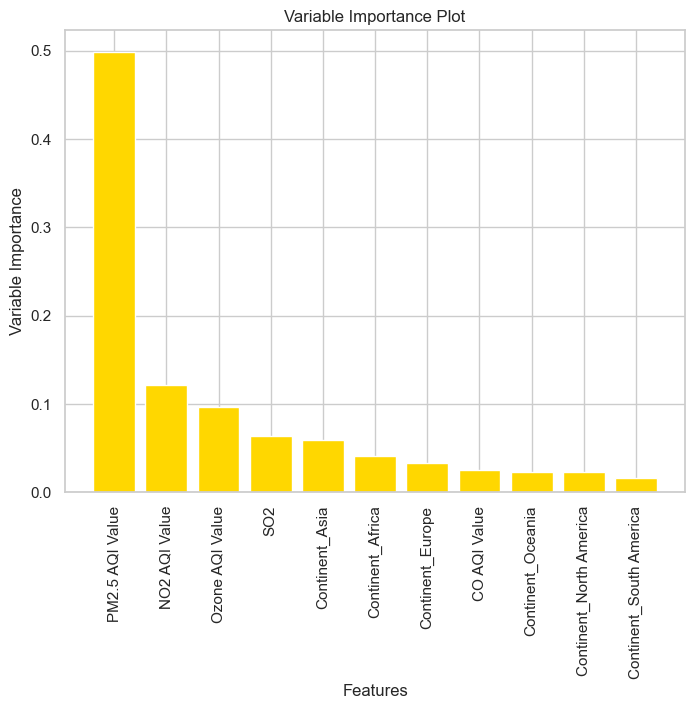

In [99]:
# Calculate the variable importance scores
vip = np.abs(pls.coef_).sum(axis=1)

# Normalize the scores
vip /= vip.sum()

# Sort the scores in descending order and get the corresponding feature names
sorted_idx = np.argsort(vip)[::-1]
sorted_features = np.array(all_feature_names)[sorted_idx]

# Plot the scores
plt.figure(figsize=(8, 6))
plt.bar(sorted_features, vip[sorted_idx], color='#FFD700')
plt.xticks(rotation=90)
plt.xlabel('Features')
plt.ylabel('Variable Importance')
plt.title('Variable Importance Plot')
plt.show()